In [1]:
import json
import os
import pickle
from collections import defaultdict
from glob import glob
from pathlib import Path
from utils import TPScoringFunction, RobustTPScoringFunction, calc_auc, can_list, ecfp, score, score_alt, timestamp, DataRobustScoringFunction, ecfp_alt
import rdkit
from rdkit import Chem
from rdkit.Chem import AllChem
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import rcParams
from matplotlib.lines import Line2D
import pandas as pd
from faerun import Faerun
import rdkit
from rdkit import Chem
from rdkit.Chem import AllChem, Draw
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from plot_utils import *
from plot_utils import load_chid
import copy 
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
params = {
    'font.size': 18,
    'legend.fontsize': 18,
    'text.usetex': False,
}
rcParams.update(params)

In [35]:
def get_chid_values(chid):
    assay_file = 'assays/processed/' + chid + '.csv'
    print('Reading data from: {assay_file}')
    df = pd.read_csv(assay_file)

    df['ecfp'] = ecfp(df.smiles)
    df1, df2 = train_test_split(df, test_size=0.5, stratify=df['label'], random_state=1)

    X1 = np.array(list(df1['ecfp']))
    X2 = np.array(list(df2['ecfp']))

    y1 = np.array(list(df1['label']))
    y2 = np.array(list(df2['label']))

    del df1['ecfp']
    del df2['ecfp']

    balance = (np.mean(y1), np.mean(y2))

    # train classifiers and store them in dictionary
    clf = RandomForestClassifier(
        n_estimators=100, random_state=0)
    clf.fit(X1, y1)
    scores = clf.predict_proba(X2)[:, 1][np.where(y2==1)]
    scores_inactive = clf.predict_proba(X1)[np.where(y1==0)]
    #scores = scores_inactive
    return np.mean(scores), np.percentile(scores,5), np.percentile(scores, 95), np.median(scores_inactive), np.percentile(scores_inactive,25), np.percentile(scores_inactive, 75)

def median_score_compound(pred, color=None, label=None, shade=False, **kwargs):
    # pred is triply nested list [n_runs, n_epochs, n_mol(variable_size) ]
    # get mean scores over runs
    pred_mean = np.array([[np.mean([z for z in y if z is not None]) for y in x] for x in pred]).T

    median = np.median(pred_mean, 1)
    q25 = np.percentile(pred_mean, 25, axis=1)
    q75 = np.percentile(pred_mean, 75, axis=1)

    plt.plot(median, c=color, label=label, **kwargs)

    plt.fill_between(
        np.arange(median.shape[0]), q25, q75, alpha=.1, color=color)


def plot_wrapper(preds_internal, primitive, name, col_dict, legend_dict, ls_dict, skip=[], xlabel=None, ylabel=None, ax=None, legend=True, leg_lw=3, **kwargs):
    if ax is not None:
        plt.sca(ax)
    for k, pred in preds_internal.items():
        if k in skip:
            continue
        primitive(
            pred, color=col_dict[k], label=legend_dict[k], ls=ls_dict[k], **kwargs)

    if legend:
        leg = plt.legend(loc='upper center', bbox_to_anchor=(
            0.5, 1.14), ncol=3, frameon=False)
        for line in leg.get_lines():
            line.set_linewidth(leg_lw)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
def load_chid(chid_dir, order, **kwargs):
    print("loading...")
    runs = [run for run in os.listdir(chid_dir) if os.path.isfile(chid_dir / run / 'results.json')]
    accumulate = []
    for run in runs:
        run_dir = chid_dir / run
        with open(run_dir / 'results.json', 'r') as f:
            results = json.load(f)

        # some runs aborted earlier. Solve this by adding the last entry a few times!
        # TODO: solve this in a better way.
        n_gen = len(results['statistics'])

        if n_gen != 151:
            results['statistics'] += [results['statistics'][-1]] * \
                (151 - n_gen)

        # create a dictionary containing arrays of shape [n_iter, n_molecules]
        preds_internal = flatten([row['preds']
                                  for row in results['statistics']])
        smiles = [row['smiles'] for row in results['statistics']]
        # array for each clf and split
        preds_external = results['predictions_external']
        accumulate.append((preds_internal, preds_external,
                           results['AUC'], smiles, ))

    # preds_internal, preds_external, aucs = [flatten(x) for x in list(zip(*accumulate))]
    preds_internal, preds_external, aucs, smiles, = list(
        zip(*accumulate))
    preds_internal = flatten(preds_internal)
    preds_external = flatten(preds_external)
    aucs = flatten(aucs)
    # legacy compatibility
    for d in [preds_internal, preds_external, aucs]:
        if 'all' in d:
            del d['all']
    preds_internal, preds_external, aucs = [
        {k: d[k] for k in order} for d in [preds_internal, preds_external, aucs]]
    return preds_internal, preds_external, aucs, smiles

In [39]:
# Set up some settings of where to read from and if/where to save figures.
# If write is set to False no plots will be saved which is useful for testing
def plot_runs(dirs = ['results/results_correlated_jak2_lstm_random_split_train_set_caps'], 
              titles = ["JAK2, LSTM, train set with caps"],
              optimizer='lstm_hc', chid='CHEMBL3888429'):
    order = ('Split1', 'Split1_alt','Split2',)
    legend_dict = dict(zip(order, ['Optimization score', 'Model control score', 'Data control score',]))
    opt_dict = {'graph_ga': 'GA', 'lstm_hc': 'LSTM', 'mso': 'PS'}
    col_dict = dict(zip(order, [ 'blue','green','red', ]))
    col_dict2 = dict(zip(order, ['cyan', 'magenta', 'green']))
    ls_dict = dict(zip(order, ['-', '--','-']))

    auc_title = False # whether or not to include auc in plot
    lw = 2 # line width
    nrows = int(len(dirs)/3) + 1 # for two optimizers
    ncols = 3 # for the number of tasks
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 20*nrows), sharex=True)
    axes = axes.flatten()
    for r_idx, directory in enumerate(dirs):
        ax = axes[r_idx]
        preds_internal, preds_external, auc, _,  = load_chid(
             Path(directory)/optimizer/chid, order)
        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', col_dict=col_dict, legend_dict=legend_dict, ls_dict=ls_dict, ax=ax, legend=False, lw=lw)
        # makes ticks a bit prettier and always makes them at multiples of 0.2
        low, high = ax.set_ylim(0., 1.0)
        yticks = np.arange(round(low/0.2) * 0.2, round(high/0.2) * 0.2 +0.01, 0.2)
        ax.set_yticks(yticks)
        m, u, l, m_inactive, u_inactive, l_inactive = get_chid_values(chid)
        ax.axhline(m, color='k', ls='--')
        ax.axhline(u, color='k', ls='--')
        ax.axhline(l, color='k', ls='--')


        # set axes labels 
        for i in range(nrows):
            ax.set_ylabel('Score')

        for i in range(ncols):
            ax.set_xlabel('Iteration')

        ax.set_title(titles[r_idx], fontsize=30)

    # create legend
    custom_lines = [Line2D([0], [0], color=col_dict[k], lw=3, ls=ls_dict[k]) for k in col_dict.keys()]
    lgd = fig.legend(custom_lines, list(legend_dict.values()), loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.03), frameon=False, fontsize=16,handlelength=3)

    fig.tight_layout()

    results_dir = Path('results/results_correlated_jak2_lstm_random_split_train_set_caps')
    plt.show()

# 1. JAK2

loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}


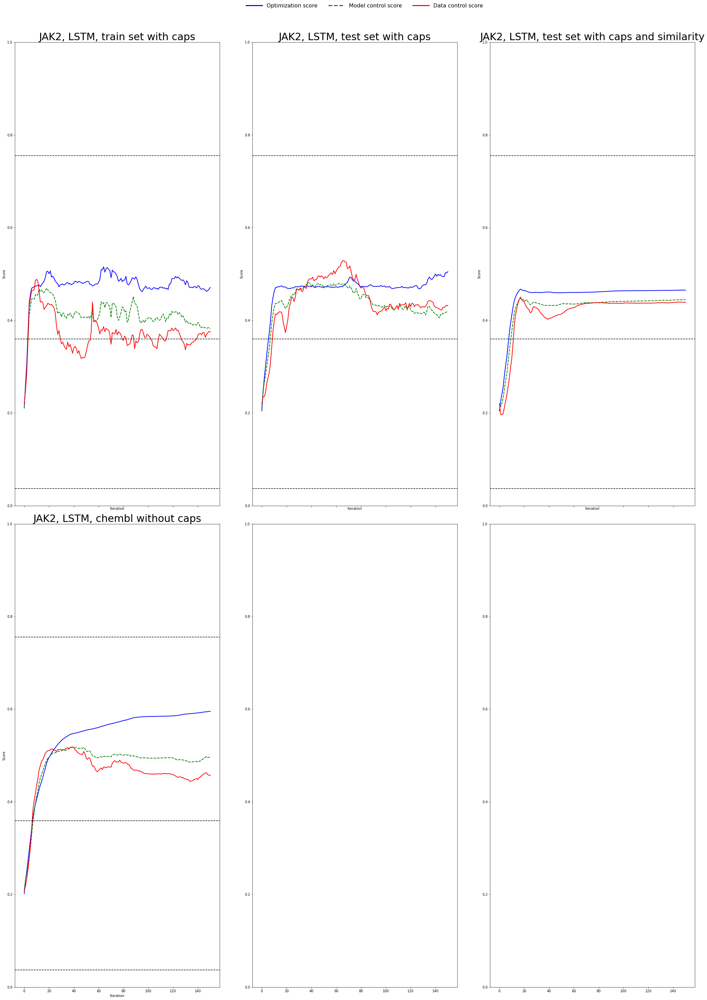

In [47]:
plot_runs(dirs = ['results/results_correlated_jak2_lstm_random_split_train_set_caps',
                  'results/results_correlated_jak2_lstm_random_split_test_set_caps',
                  'results/results_correlated_jak2_lstm_random_split_test_set_caps_sim',
                  'results/results_correlated_jak2_lstm_random_split_chembl_no_caps'],
         titles = ["JAK2, LSTM, train set with caps", "JAK2, LSTM, test set with caps", "JAK2, LSTM, test set with caps and similarity",
                  "JAK2, LSTM, chembl without caps"])

loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}


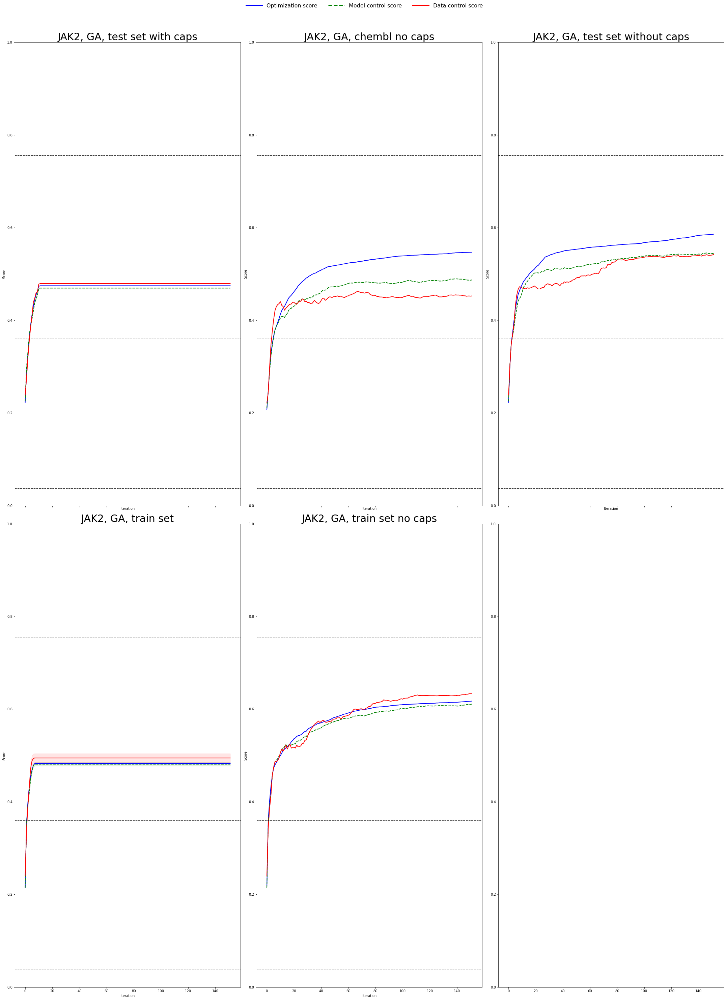

In [50]:
plot_runs(dirs = ['results/results_correlated_jak2_ga_random_split',
                  'results/results_correlated_jak2_ga_random_split_chembl_no_caps',
                  'results/results_correlated_jak2_ga_random_split_test_set_no_caps',
                  'results/results_correlated_jak2_ga_random_split_train_set',
                  'results/results_correlated_jak2_ga_random_split_train_set_no_caps'],
         titles = ["JAK2, GA, test set with caps", "JAK2, GA, chembl no caps",
                   "JAK2, GA, test set without caps", "JAK2, GA, train set",
                   "JAK2, GA, train set no caps",], optimizer='graph_ga')

loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}
loading...
Reading data from: {assay_file}


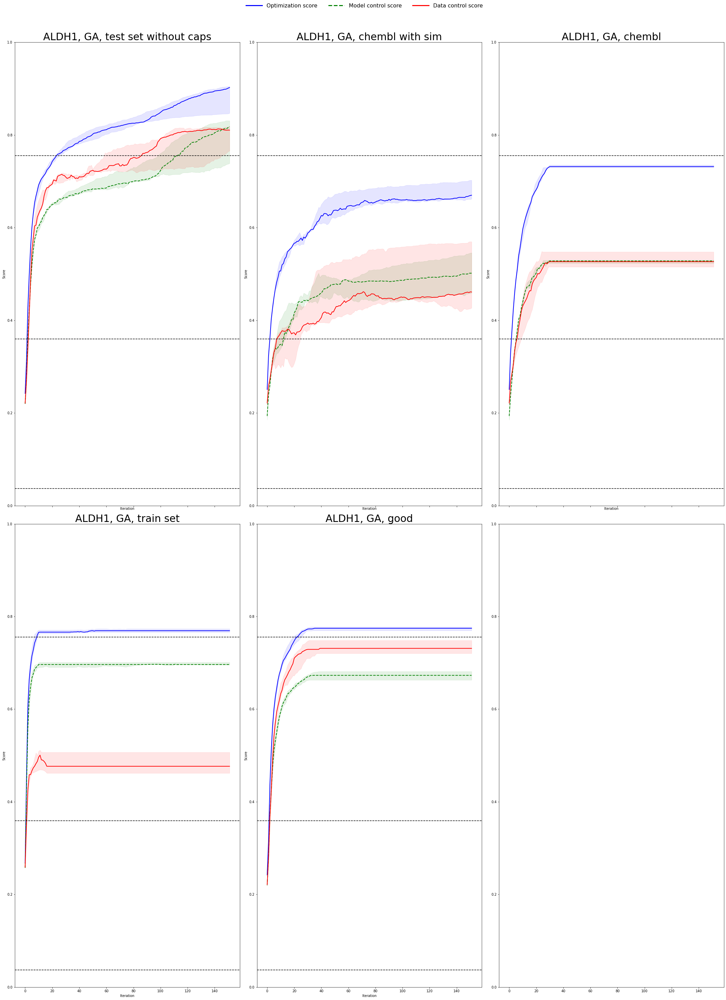

In [52]:
plot_runs(dirs = ['results/results_correlated_aldh_ga_test_no_cap',
                  'results/results_correlated_aldh_ga_generic_cap_sim0.6_test',
                  'results/results_correlated_aldh_ga_generic_cap',
                  'results/results_correlated_aldh_ga_cap_train',
                 'results/results_correlated_test_ga'],
         titles = ["ALDH1, GA, test set without caps", "ALDH1, GA, chembl with sim",
                   "ALDH1, GA, chembl", "ALDH1, GA, train set","ALDH1, GA, good"], optimizer='graph_ga')

## Table 2

## Figure 3: Median scores for both optimizers

lstm_hc
CHEMBL3888429
loading...
['2021-05-20_08:58:15']
(151, 1)
(151, 1)
(151, 1)
(151, 1)
(151, 1)
(151, 1)
0.0
1.0
[0.  0.2 0.4 0.6 0.8 1. ]
Reading data from: {assay_file}


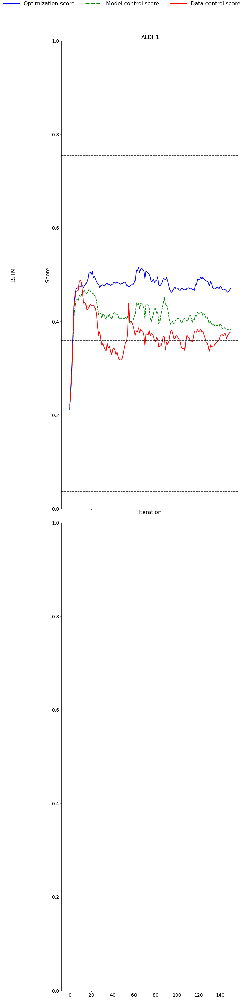

In [96]:
from scipy import stats

chids = ['CHEMBL3888429']
chids = ['ESR_ant', 'CHEMBL1909140', 'CHEMBL3888429', 'CHEMBL1909203']
chids = ['CHEMBL3888429',]
#chids = [ 'CHEMBL1909140_cleaned', 'CHEMBL1909140_cleaned']
#chids = [ 'caco2_sanofi_hard', 'caco2_sanofi_hard']

#chids = sorted(os.listdir('results/is_cleaned/lstm_hc'))



auc_title = False # whether or not to include auc in plot
lw = 2 # line width
nrows = 2 # for two optimizers
ncols = len(chids) # for the number of tasks


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 20*nrows), sharex=True)
print(axes)
for r_idx, optimizer in enumerate(optimizers):
    print(optimizer)
    for c_idx, chid in enumerate(chids):
        print(chid)
        
        ax = axes[r_idx]
        preds_internal, preds_external, auc, _,  = load_chid(
            results_dir/optimizer/chid, order)
        #preds_internal['Split1_modified'] = build_alternative_predictions(np.array(preds_internal['Split1']), optimization_scores, control_spread)
        #print(preds_internal)
       
        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', col_dict=col_dict, legend_dict=legend_dict, ls_dict=ls_dict, ax=ax, legend=False, lw=lw)

        # makes ticks a bit prettier and always makes them at multiples of 0.2
        low, high = ax.set_ylim(0., 1.0)
        print(low)
        print(high)
        yticks = np.arange(round(low/0.2) * 0.2, round(high/0.2) * 0.2 +0.01, 0.2)
        print(yticks)
        ax.set_yticks(yticks)
        m, u, l, m_inactive, u_inactive, l_inactive = get_chid_values(chid)
        ax.axhline(m, color='k', ls='--')
        ax.axhline(u, color='k', ls='--')
        ax.axhline(l, color='k', ls='--')


# set axes labels 
for i in range(nrows):
    ax.set_ylabel('Score')
    
for i in range(ncols):
    ax.set_xlabel('Iteration')

# set titles to denote tasks
for i, chid in enumerate(chids):
    title = chid2name.get(chid, chid)
    if auc_title:
        title += f' ({aucs[chid][0]:.2f})'
    ax.set_title("ALDH1", fontsize=16)

# create legend
custom_lines = [Line2D([0], [0], color=col_dict[k], lw=3, ls=ls_dict[k]) for k in col_dict.keys()]
lgd = fig.legend(custom_lines, list(legend_dict.values()), loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.03), frameon=False, fontsize=16,handlelength=3)

# add optimizer info by adding text
text_fields = []
xtext = -55
for i, optimizer in enumerate(optimizers):
    txt = ax.text(xtext, sum(ax.get_ylim()) /2 , opt_dict[optimizer], rotation=90, verticalalignment='center')
    text_fields.append(txt)
    
fig.tight_layout()


In [97]:
from utils import ecfp, ecfp_alt
import pandas as pd 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

def get_chid_values(chid):
    assay_file = 'assays/processed/' + chid + '.csv'
    print('Reading data from: {assay_file}')
    df = pd.read_csv(assay_file)

    df['ecfp'] = ecfp(df.smiles)
    df1, df2 = train_test_split(df, test_size=0.5, stratify=df['label'], random_state=1)

    X1 = np.array(list(df1['ecfp']))
    X2 = np.array(list(df2['ecfp']))

    y1 = np.array(list(df1['label']))
    y2 = np.array(list(df2['label']))

    del df1['ecfp']
    del df2['ecfp']

    balance = (np.mean(y1), np.mean(y2))

    # train classifiers and store them in dictionary
    clf = RandomForestClassifier(
        n_estimators=100, random_state=0)
    clf.fit(X1, y1)
    scores = clf.predict_proba(X2)[:, 1][np.where(y2==1)]
    scores_inactive = clf.predict_proba(X1)[np.where(y1==0)]
    #scores = scores_inactive
    return np.mean(scores), np.percentile(scores,5), np.percentile(scores, 95), np.median(scores_inactive), np.percentile(scores_inactive,25), np.percentile(scores_inactive, 75)

In [66]:
df_shp2 = pd.read_csv('../200525_SHP2_closest_cpds_w_Caco2.csv')
df_shp2.drop('Preferred Parent Id', inplace=True, axis=1)
smiles_shp2 = df_shp2['Parent Structure']
caco_shp2 = df_shp2['Caco2 Permeability;Mean;PTotal GMean (10-7cm/s);Conditions: A->B pH6.5->7.4 BSA%0(.5)->5 NoAdd']
df_shp2.columns = ['smiles', 'label']
indexes = np.arange(len(df_shp2['label']))
selected_idxs = np.random.choice(indexes, size=1000)

In [28]:
df = pd.DataFrame(data=np.transpose([np.array(smiles_shp2)[selected_idxs], np.array(1 * (caco_shp2<5))[selected_idxs]]), columns=['smiles', 'label'])
df

,smiles,label
0,FC1(CCN(CC1)c2nnc(o2)-c3cc4c(cc3)S(=O)(=O)C[C@...,0
1,FC(F)Oc1c(cc(cc1)Cl)[C@H]2C[C@](c3nc4n(c32)cc(...,0
2,N1(C[C@@H](CC1)Oc2ccccc2)C(=O)C3(OCCC3)C,0
3,FCC(ONC(=O)c4sc1c(nc(nc1)Nc2c3c(ccc2)N(C(=O)[C...,0
4,[nH]1c2c(c(c1)C=O)cccc2C(=O)N3CCN(CC3)C(=O)CN5...,1
...,...,...
995,Clc2c(cc1c(c(ncc1)N)c2)C[C@@H](N3CC[C@@H](C3=O...,1
996,s4c1c(nc(nc1)Nc2c(cc(cc2)N3CCN(CC3)CC)OC)c(c4C...,0
997,s2c1c(ncnc1)c(c2-c3nn(cc3)CCO)O[C@@H](COC)C,0
998,FC(F)(F)CONC(=O)c3sc1c(nc(nc1)Nc2c(nc(cc2)OC)O...,0


In [187]:
df.to_csv('assays/processed/caco2_sanofi_hard.csv')

In [202]:
df = pd.read_csv("210415_LIT_PCBA_ALDH1_Best_AB_sets.csv")
in_set_A = np.where(df['in_set_A']==1)[0]
in_set_B = np.where(df['in_set_B']==1)[0]
smiles = df["SMILES"]
activity = df["Act"]
index_test = []
for i in range(len(smiles)):
    if i not in in_set_A and i not in in_set_B:
        index_test.append(i)
        
in_test = np.array(index_test)

#in_test = np.where(df['in_set_A']==0 and df['in_set_B']==0)


In [209]:

smiles= np.array(smiles)
smiles_1 = smiles[in_set_A]
smiles_2 = smiles[in_set_B]
smiles_test = smiles[in_test]

clf_1 = LogisticRegressionCV(Cs=1, random_state=0)
clf_1 = RandomForestClassifier(n_estimators=100, random_state=0)
clf_1.fit(np.array(ecfp(smiles_1)), np.array(activity[in_set_A]))


clf_2 = LogisticRegressionCV(Cs=1, random_state=1)
clf_2 = RandomForestClassifier(n_estimators=100, random_state=0)
clf_2.fit(np.array(ecfp(smiles_2)), np.array(activity[in_set_B]))

scores_1 = clf_1.predict_proba(np.array(ecfp(smiles_test)))[:, 1]
scores_2 = clf_2.predict_proba(np.array(ecfp(smiles_test)))[:, 1]

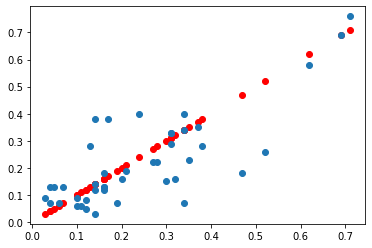

In [210]:
plt.scatter(scores_1, scores_1, c='r')
plt.scatter(scores_1, scores_2)

In [211]:
max(scores_1)

0.71

In [56]:
assay_file = 'assays/processed/' + 'CHEMBL3888429' + '.csv'
print('Reading data from: {assay_file}')
df = pd.read_csv(assay_file)
scores_1 = []
scores_2 = []
df['ecfp'] = ecfp(df.smiles)
for i in range(50):

    dftrain, dftest = train_test_split(df, test_size=0.1, stratify=df['label'], random_state=i)

    df1, df2 = train_test_split(dftrain, test_size=0.5, stratify=dftrain['label'])

    X_test = np.array(list(dftest['ecfp']))
    y_test = np.array(list(dftest['label']))

    X1 = np.array(list(df1['ecfp']))
    X2 = np.array(list(df2['ecfp']))

    y1 = np.array(list(df1['label']))
    y2 = np.array(list(df2['label']))
    

    del df1['ecfp']
    del df2['ecfp']

    balance = (np.mean(y1), np.mean(y2))

    # train classifiers and store them in dictionary
    clf = RandomForestClassifier(
        n_estimators=100, random_state=0)

    #clf_1 = LogisticRegressionCV(Cs=3, penalty='l1', solver='liblinear')
    clf_1 = RandomForestClassifier(
        n_estimators=100, random_state=0)
    #clf_1 = MLPClassifier(hidden_layer_sizes=(100, 50, 50))
    #clf_1 = LogisticRegressionCV(Cs=3, penalty='l2', solver='liblinear')

    #clf_2 = LogisticRegressionCV(Cs=1, penalty='l2', solver='liblinear')

    clf_2 = RandomForestClassifier(
        n_estimators=100, random_state=1)
    #clf_2 = DecisionTreeClassifier()
    #clf_2 = MLPClassifier(hidden_layer_sizes=(100, 50, 50))

    #clf_2 = LogisticRegressionCV(Cs=1, penalty='l2', solver='liblinear')


    clf_1.fit(X1, y1)
    clf_2.fit(X2, y2)
    scores_1.extend(clf_1.predict_proba(X_test)[:, 1])
    scores_2.extend(clf_2.predict_proba(X_test)[:, 1])

Reading data from: {assay_file}


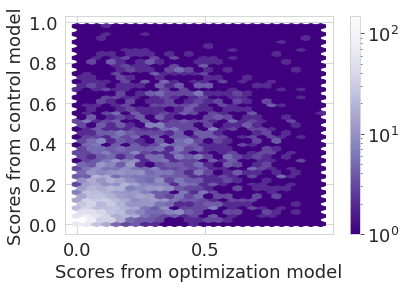

In [67]:
import seaborn as sns
plt.hexbin(scores_1, scores_2, bins='log', gridsize=(25,25), cmap=plt.cm.Purples_r)
plt.xlabel('Scores from optimization model')
plt.ylabel('Scores from control model')

plt.colorbar()
plt.show()

In [19]:
score_max, score_min = max(scores_1), min(scores_1)
#score_min = 0
#score_max = 1.0
counts = []
n_steps = 25
step = (score_max - score_min)/n_steps
control_scores = []
optimization_scores = []
control_spread = []
scores_1 = np.array(scores_1)
scores_2 = np.array(scores_2)

for i in range(n_steps):
    lower_bound = score_min + step * i
    upper_bound = score_min + step * (i+1)
    indexes_low = np.where(scores_1>=lower_bound)[0]
    indexes_up = np.where(scores_1<upper_bound)[0]
    indexes_step = []
    
    for j in range(len(scores_1)):
        if j in indexes_low and j in indexes_up:
            indexes_step.append(j)
    indexes_step = np.array(indexes_step)
    counts.append(len(indexes_step))
    try:
        
        control_scores.append(np.mean(scores_2[indexes_step]))
    except:
        
        control_scores.append(control_scores[-1])

    try:
        #optimization_scores.append(np.mean(scores_1[indexes_step]))
        optimization_scores.append(0.5 * (lower_bound + upper_bound))
    except:
        optimization_scores.append(-1)
        
    try:
        #optimization_scores.append(np.mean(scores_1[indexes_step]))
        control_spread.append(scores_2[indexes_step])
    except:
        control_spread.append(control_spread[-1])
        
print(optimization_scores)

[0.0436, 0.0708, 0.098, 0.12519999999999998, 0.15239999999999998, 0.17959999999999998, 0.20679999999999998, 0.23399999999999999, 0.2612, 0.2884, 0.31559999999999994, 0.34279999999999994, 0.36999999999999994, 0.39719999999999994, 0.42439999999999994, 0.45159999999999995, 0.47879999999999995, 0.506, 0.5331999999999999, 0.5604, 0.5875999999999999, 0.6148, 0.6419999999999999, 0.6692, 0.6963999999999999]


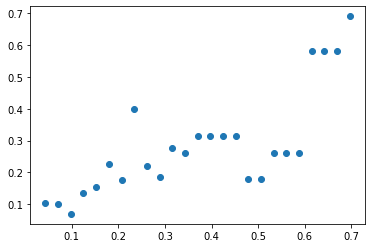

In [20]:
plt.scatter(optimization_scores, control_scores)

{'whiskers': [<matplotlib.lines.Line2D at 0x7f89738b2390>,
 'caps': [<matplotlib.lines.Line2D at 0x7f89737fbe10>,
 'boxes': [<matplotlib.lines.Line2D at 0x7f8973724358>,
 'medians': [<matplotlib.lines.Line2D at 0x7f89737fba90>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f89707ace48>,
 'means': []}

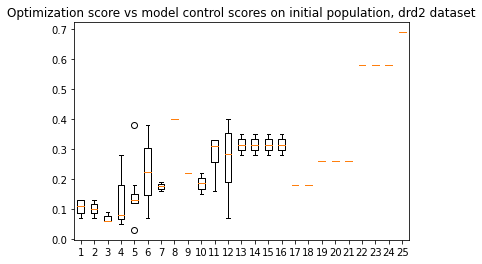

In [21]:
plt.title("Optimization score vs model control scores on initial population, drd2 dataset")
data = control_spread
plt.boxplot(data)

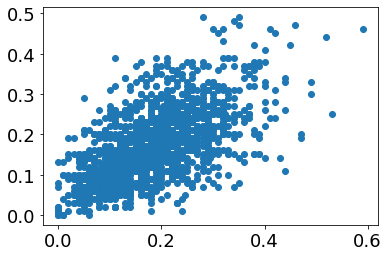

In [173]:
plt.scatter(scores_1, scores_2)

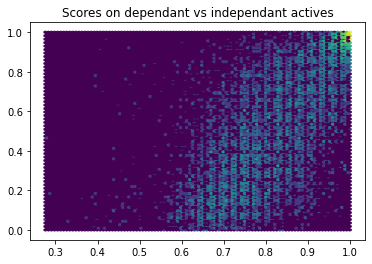

In [82]:
plt.title("Scores on dependant vs independant actives")
plt.hexbin(scores_1, scores_2, bins="log")

# Figure 2: Scatter plot series
Scatter plots. To create the contours plot the corresponding script (TODO: add name)

In [28]:
from rdkit import Chem
suppl = Chem.SDMolSupplier('210502_JAK2_Best_RamdomForest_AB_sets.sdf')
smiles = []
in_set_A = []
in_set_B = []
activity = []
for mol in suppl:
    smiles.append(mol.GetProp('SMILES'))
    in_set_A.append(float(mol.GetProp('in_set_A')))
    in_set_B.append(float(mol.GetProp('in_set_B')))
    activity.append(float(mol.GetProp('Act')))
smiles = np.array(smiles)
activity = np.array(activity)

X = ecfp(smiles)

X_train, X_test, y_train, y_test = train_test_split(X, activity, test_size=0.2, random_state=0)
X1, X2, y1, y2 = train_test_split(X_train, y_train, test_size=0.5, random_state=42)

balance = (np.mean(y1), np.mean(y2))

# train classifiers and store them in dictionary
clf = RandomForestClassifier(
    n_estimators=100, random_state=0)

clf_1 = RandomForestClassifier(
    n_estimators=100, random_state=0, min_samples_leaf=3)
#clf_1 = MLPClassifier(hidden_layer_sizes=(100, 50, 50))
#clf_1 = LogisticRegressionCV(Cs=3, penalty='l2', solver='liblinear')
#clf_1 = DecisionTreeClassifier()

clf_2 = RandomForestClassifier(
    n_estimators=100, random_state=0, min_samples_leaf=3)
#clf_2 = DecisionTreeClassifier()
#clf_2 = MLPClassifier(hidden_layer_sizes=(100, 50, 50))

#clf_2 = LogisticRegressionCV(Cs=1, penalty='l2', solver='liblinear')


clf_1.fit(X1, y1)
clf_2.fit(X2, y2)
scores_1 = clf_1.predict_proba(X_test)[:, 1]
scores_2 = clf_2.predict_proba(X_test)[:, 1]

results/results_correlated_jak2_lstm_random_split_train_set_caps/lstm_hc/CHEMBL3888429
loading...
['2021-05-20_08:58:15']


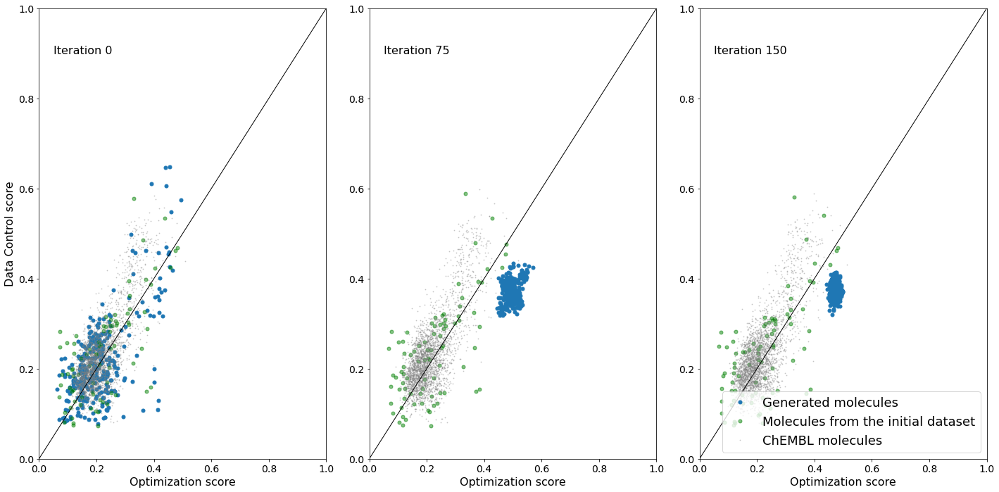

In [98]:
import seaborn as sns
import scipy.stats as st

name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
ncols = 3 # one column for four different iterations
n_runs = 1 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

# `scatter` controls whether or not to plot OS / DCS on 
for scatter in [True]:
    for chid in chids:
        for optimizer in optimizers:
            chid_dir = results_dir/optimizer/chid
            print(chid_dir)
            
            # get predictions for optimized molecules
            preds_internal, preds_external, auc, _,  = load_chid(results_dir/optimizer/chid, order)
            split1 = preds_internal['Split1']
            split2 = preds_internal['Split2']
            
            # get even spaced intervals in iterations
            n_iterations = len(split1[0]) - 1
            plot_iters = np.linspace(0, n_iterations, ncols).astype('int32')
            #plot_iters = [0, 3, 5, 15]
            fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(20, 10), sharey=False)
           
            for i, iteration in enumerate(plot_iters):   # loop over iterations
                ax = axes[i]

                # get predictions on trainset
                #p11s, p21s, p12s, p22s, y1s, y2s = trainset_predictions[chid]
                
                # plot contours. If scatter is true OS/DCS on trainset actives will be plotted.
                
                # plot optimized molecules
                a1 = jitter(split1[0][iteration], scale=scale)
                a2 = jitter(split2[0][iteration], scale=scale)
                ax.plot(a1,a2,'o',rasterized=True, markersize=5, alpha=1, label='Generated molecules')
                
                a1 = jitter(scores_1, scale=scale)
                a2 = jitter(scores_2, scale=scale)
                ax.plot(a1,a2,'o',rasterized=True, markersize=5, alpha=0.5, c='green', label='Molecules from the initial dataset')
                
                # plot random molecules from chembl
                e1 = jitter(preds_external['Split1'][0], scale=scale)
                e2 = jitter(preds_external['Split2'][0], scale=scale)
                ax.plot(e1,e2, 'o', rasterized=True, markersize=1, alpha=0.3, c='grey', label="ChEMBL molecules")
                
                # add diagonal
                ax.plot([0,1],[0,1], lw=1, c='black')
                
                # plot appearance and label
                ax.set_xlim((0,1))
                ax.set_ylim((0,1))
                ax.set_xticks(np.linspace(0,1,6))
                ax.set_yticks(np.linspace(0,1,6))
                ax.set_xlabel('Optimization score')
                ax.text(0.05,.9, f"Iteration {iteration}")
                
            axes[0].set_ylabel('Data Control score')
            plt.tight_layout()
            plt.subplots_adjust(wspace = 0.15)
            plt.legend(loc='lower right')
            if False: #write or True:
                add = 'trainscatter_' if scatter else ''
                plt.savefig(f'{figure_dir}/scatter/{add}{optimizer}_{chid2name[chid]}.pdf', dpi=300)
            #plt.show()

# Additional plots of properties

In [ ]:
from rdkit.Chem import Descriptors
from rdkit import Chem
@lru_cache(int(1e4))
def cache_mfs(s):
    return Chem.MolFromSmiles(s)
    
@lru_cache(int(1e6))
def cache_mw(s):
    try:
        return Descriptors.MolWt(cache_mfs(s))
    except: 
        return None

RDKit WARNING: [13:46:02] Enabling RDKit 2019.09.1 jupyter extensions


In [ ]:
@lru_cache(int(1e6))
def cache_logp(s):
    try:
        return Descriptors.MolLogP(cache_mfs(s))
    except: 
        return None

results/goal_directed_paper/graph_ga/CHEMBL1909140
100


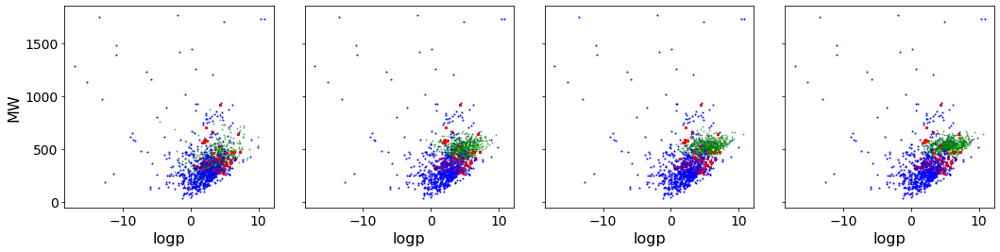

results/goal_directed_paper/lstm_hc/CHEMBL1909140
983


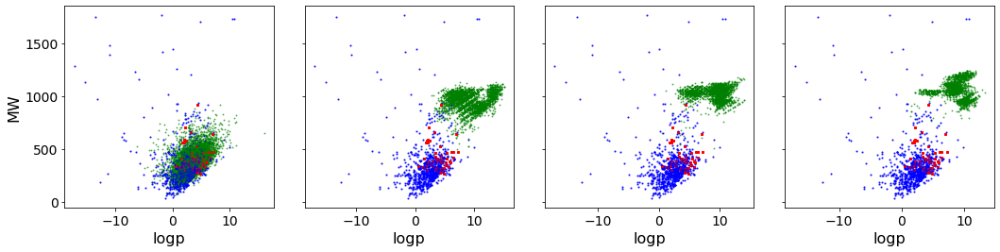

results/goal_directed_paper/mso/CHEMBL1909140
200


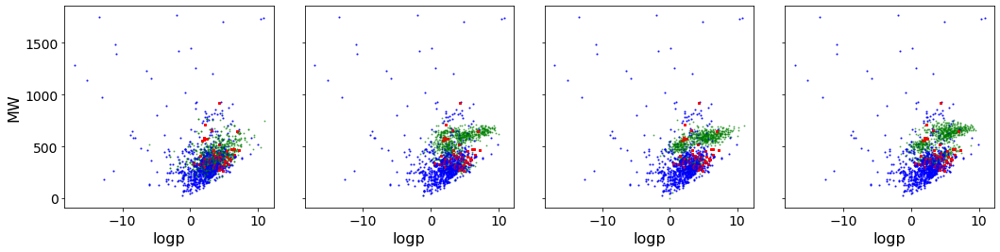

results/goal_directed_paper/graph_ga/CHEMBL1909203
100


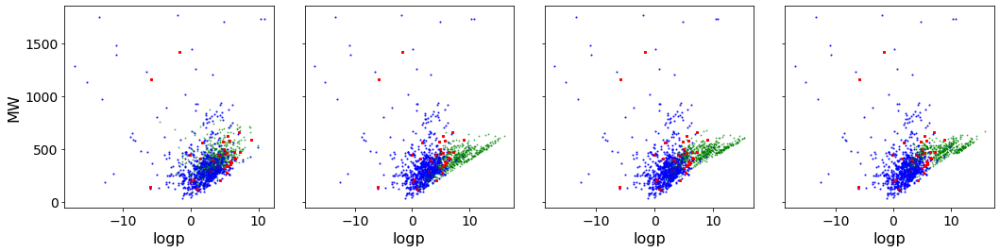

results/goal_directed_paper/lstm_hc/CHEMBL1909203
994


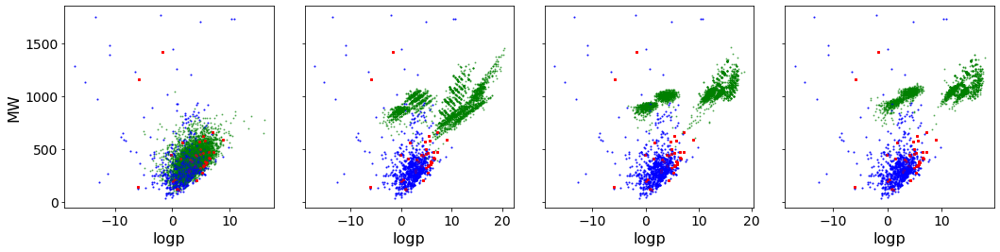

results/goal_directed_paper/mso/CHEMBL1909203
200


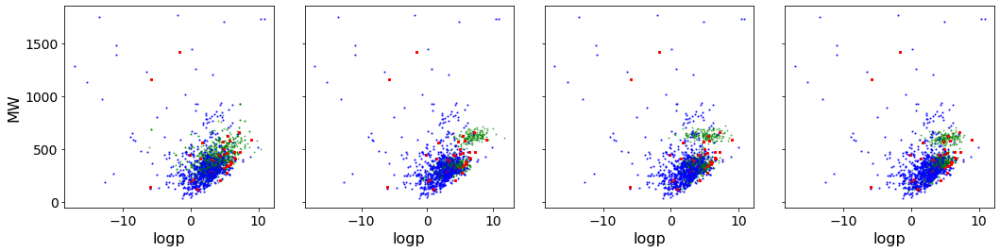

results/goal_directed_paper/graph_ga/CHEMBL3888429
100


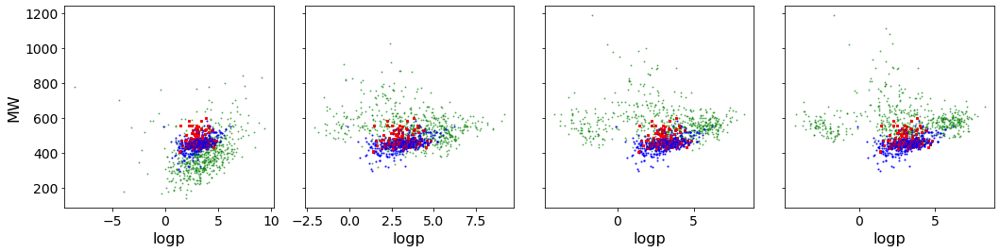

results/goal_directed_paper/lstm_hc/CHEMBL3888429
985


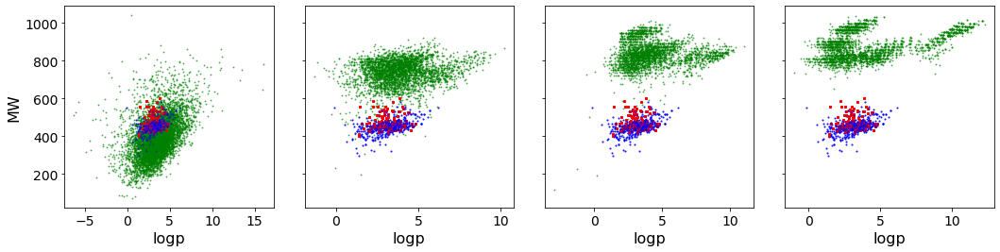

results/goal_directed_paper/mso/CHEMBL3888429
200


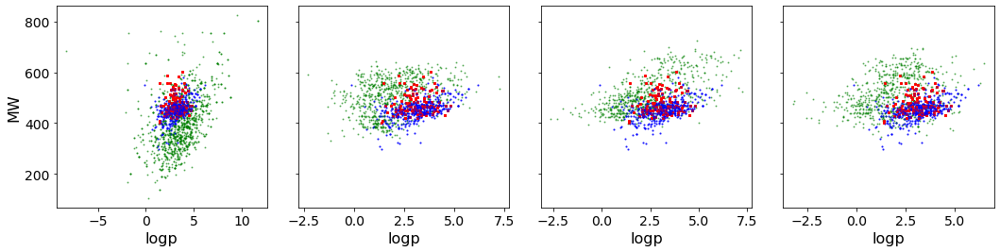

In [ ]:
import seaborn as sns
import scipy.stats as st

name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
ncols = 4 # one column for four different iterations
n_runs = 6 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

# `scatter` controls whether or not to plot OS / DCS on 



for chid in chids:
    for optimizer in optimizers:
        chid_dir = results_dir/optimizer/chid
        print(chid_dir)

        # get predictions for optimized molecules
        _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)

        # get even spaced intervals in iterations
        n_iterations = len(split1[0]) - 1
        plot_iters = np.linspace(0, n_iterations, ncols).astype('int32')

        fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, 4), sharey=True)
        for i, iteration in enumerate(plot_iters):   # loop over iterations
            ax = axes[i]
            
            from rdkit import Chem
            
            # plot optimized molecules
            for run in range(n_runs):
                smiles_ri = smiles[run][iteration]
                logps = [cache_logp(s) for s in smiles_ri]
                mws = [cache_mw(s) for s in smiles_ri]
                ax.plot(logps,mws,'o',rasterized=True, markersize=1, alpha=0.5, c='green')
                
                si = split_info[run]
                active_smiles = list(si[si.label==1]['smiles'])
                inactive_smiles = list(si[si.label==0]['smiles'])
                
                active_logp =  [cache_logp(s) for s in active_smiles]
                inactive_logp =  [cache_logp(s) for s in inactive_smiles]
                
                active_mws = [cache_mw(s) for s in active_smiles]
                inactive_mws =  [cache_mw(s) for s in inactive_smiles]
                
                ax.plot(active_logp, active_mws,'o', markersize=2, c='red',alpha=0.5)
                ax.plot(inactive_logp, inactive_mws,'o', markersize=1, c='blue', alpha=0.2)
            
            # plot appearance and label
#             ax.set_xlim((0,1))
#             ax.set_ylim((0,1))
#             ax.set_xticks(np.linspace(0,1,6))
#             ax.set_yticks(np.linspace(0,1,6))
            ax.set_xlabel('logp')
#             ax.text(0.05,.9, f"Iteration {iteration}")

        axes[0].set_ylabel('MW')
        plt.tight_layout()
        plt.subplots_adjust(wspace = 0.15)
        if write:
            add = 'trainscatter_' if scatter else ''
            plt.savefig(f'{figure_dir}/scatter/{add}{optimizer}_{chid2name[chid]}.pdf', dpi=300)
        plt.show()

# logP vs MW last iteration

# T-SNE plot independent

loading...
['2021-01-27_22:45:12']
1


/site/rp/work/projects/DD/Anaconda4AI/anaconda3/envs/torch_env/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:1575: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


loading...
['2021-01-28_01:26:29']
1


/site/rp/work/projects/DD/Anaconda4AI/anaconda3/envs/torch_env/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:1575: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


loading...
['2021-01-28_05:23:50']
1


/site/rp/work/projects/DD/Anaconda4AI/anaconda3/envs/torch_env/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:1575: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


loading...
['2021-01-27_22:45:12']
1


/site/rp/work/projects/DD/Anaconda4AI/anaconda3/envs/torch_env/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:1575: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


loading...
['2021-01-28_01:26:29']
1


/site/rp/work/projects/DD/Anaconda4AI/anaconda3/envs/torch_env/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:1575: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


loading...
['2021-01-28_05:23:50']
1


/site/rp/work/projects/DD/Anaconda4AI/anaconda3/envs/torch_env/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:1575: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)


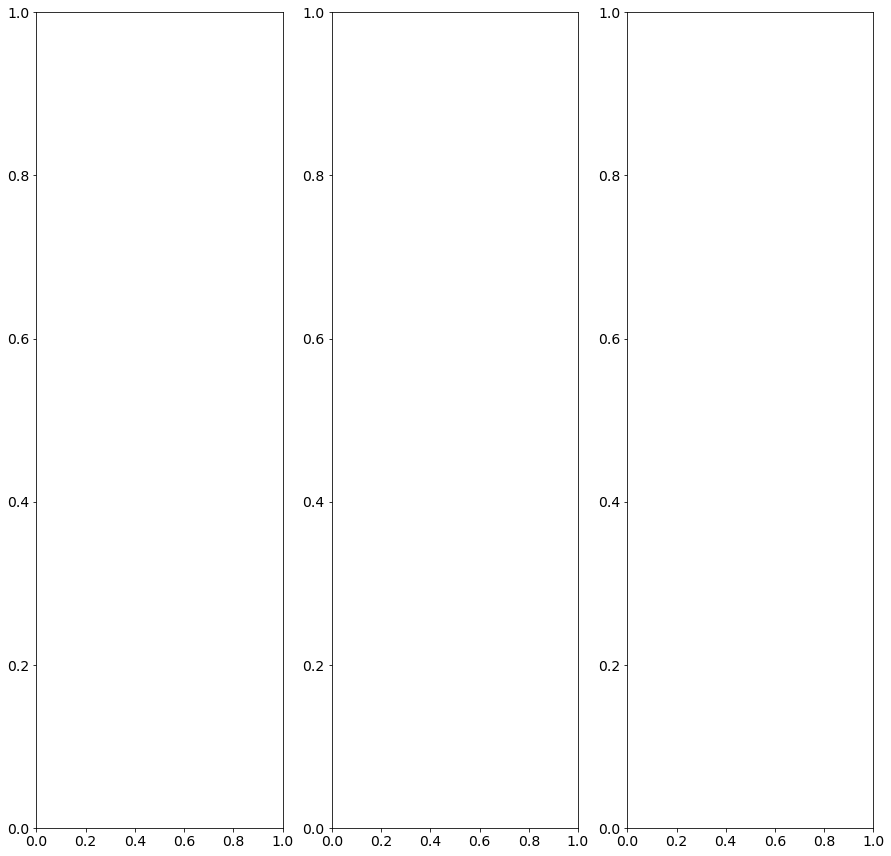

In [11]:
# dictionary that stores the embeddings of generated, active and inactive molecules for all tasks and 
import seaborn as sns
import scipy.stats as st
from utils import ecfp
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE

it_dict = {'first': 0, 'last': -1}
fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, 15), sharey=False, sharex=False)

emb_first_last = {} 
generated_lengths_first_last = {}

for it_name, it in it_dict.items():
    embeddings = defaultdict(dict)
    generated_lengths = defaultdict(dict)
    
    for row, optimizer in enumerate(optimizers):
        for col, chid in enumerate(chids):
            ax = axes[col]
            chid_dir = results_dir/optimizer/chid
            _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)

            # plot optimized molecules
            smiles_generated = [s  for smiles_run in smiles for s in smiles_run[it]]
            print(len(smiles))
            generated_lengths[optimizer][chid] = [len(smiles_run[it]) for smiles_run in smiles]

            si = split_info[0]
            active_smiles = list(si[si.label==1]['smiles'])
            inactive_smiles = list(si[si.label==0]['smiles'])

            n_gen = len(smiles_generated)
            n_act = len(active_smiles)
            n_inact = len(inactive_smiles)

            all_smiles = smiles_generated + active_smiles + inactive_smiles
            fps = np.array(ecfp(all_smiles))

            dists = pairwise_distances(fps, metric='jaccard', n_jobs=5)

    #         print(dists.shape)
            X_embedded = TSNE(n_components=2, metric='precomputed').fit_transform(dists)
    #         print(X_embedded.shape)

            Xs = np.split(X_embedded, [n_gen, n_gen+n_act]) # X_generated, X_active, X_inactive
            embeddings[optimizer][chid] = dict(zip(['Generated', 'Active', 'Inactive'], Xs))
            
    emb_first_last[it_name] = embeddings
    generated_lengths_first_last[it_name] = generated_lengths

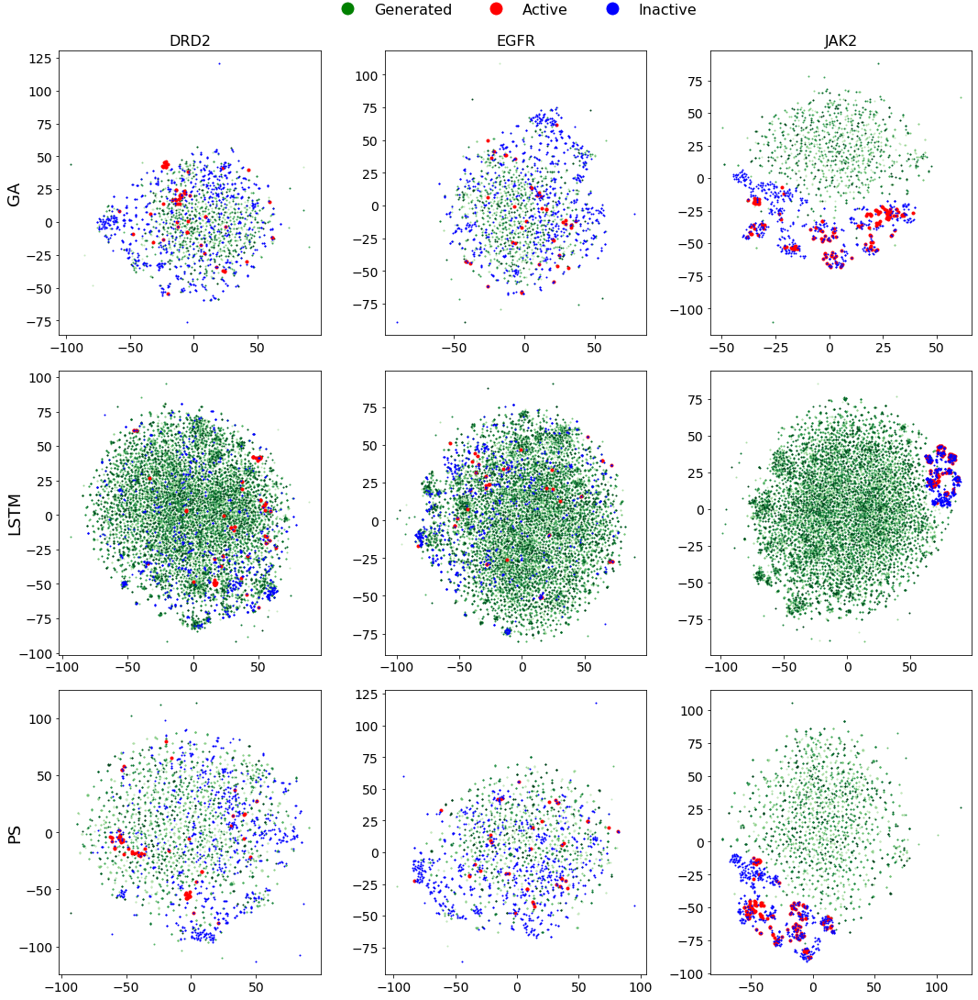

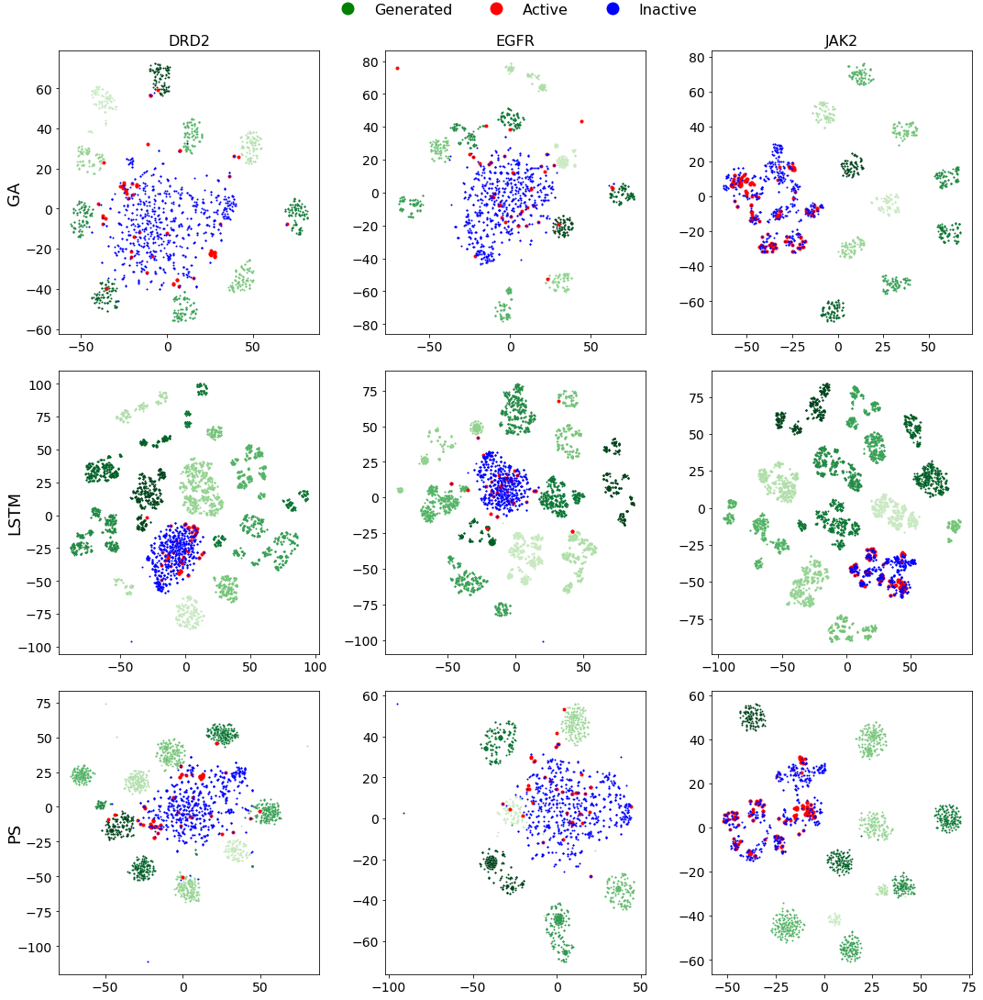

In [ ]:
name2chid = {v: k for k,v in chid2name.items()}
nrows = len(optimizers)
ncols = len(chids) # one column for four different iterations

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

source_color = {
    'Generated': 'green',
    'Active': 'red',
    'Inactive': 'blue'}

for it_name, embeddings in emb_first_last.items():
    generated_lengths =  generated_lengths_first_last[it_name]
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15), sharey=False, sharex=False)

    cmap = plt.get_cmap('Greens', 256)

    for row, optimizer in enumerate(embeddings):
        for col, chid in enumerate(embeddings[optimizer]):
            ax = axes[row][col]
            Xs = embeddings[optimizer][chid]

            for label, X in Xs.items():
                markersize = 3 if label == 'Active' else 1
                c = source_color[label]
                if label != 'Generated':
                    ax.plot(X[:,0], X[:,1],'o', markersize=markersize, c=c, alpha=1, label=label, rasterized=True)
                else:
                    split_idx = np.cumsum(generated_lengths[optimizer][chid])[:-1]
                    Xs_run = np.split(X, split_idx)
                    for X_run, col_float in zip(Xs_run, np.linspace(0.25,1,len(Xs_run))):
                        c = cmap(col_float)
    #                     c = None # more colors for generated points
                        ax.plot(X_run[:,0], X_run[:,1],'o', markersize=markersize, c=c, alpha=1, label=label, rasterized=True)

    for col, chid in enumerate(chids):
        axes[0][col].set_title(chid2name[chid], size=16)

    text_fields = []
    for row, optimizer in enumerate(optimizers):
        ax = axes[row][0]
        txt = ax.text(-0.2, 0.5 , opt_dict[optimizer], rotation=90, verticalalignment='center', transform=ax.transAxes, fontsize=18)
        text_fields.append(txt)

    legend_elements = [Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=15) for color, label in zip(['Green', 'Red', 'Blue'], ['Generated', 'Active', 'Inactive'])]
    # legend_elements = [Line2D([0], [0], marker='o', color=cmap(x), label=label, markerfacecolor=cmap(x), markersize=15) for x in  np.linspace(0,1,10)]

    lgd = fig.legend(handles=legend_elements, ncol=3, frameon=False, fontsize=16,loc='upper center', bbox_to_anchor=(0.52,1.02))

    plt.tight_layout()
    if write or True:
        plt.savefig(f'{figure_dir}/tSNE_{it_name}.pdf', dpi=300, bbox_extra_artists=[lgd]+text_fields, bbox_inches='tight')
    plt.show()

In [ ]:
lengths_gen = defaultdict(dict)

for col, chid in enumerate(chids):
    ax = axes[col]
    
    smiles_dict = {}
    for row, optimizer in enumerate(optimizers):
        chid_dir = results_dir/optimizer/chid
        _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)

        # plot optimized molecules
        smiles_dict[f'{optimizer}_x_generated'] = [s  for run in range(n_runs) for s in smiles[run][-1]]
        lengths_gen[chid][optimizer] = [len(smiles_run[-1]) for smiles_run in smiles]

In [ ]:
import seaborn as sns
import scipy.stats as st
from utils import ecfp
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE
name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
nrows = len(optimizers)
ncols = len(chids) # one column for four different iterations
n_runs = 6 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

# `scatter` controls whether or not to plot OS / DCS on 

all_tasks_emb = {}
for col, chid in enumerate(chids):
    ax = axes[col]
    
    smiles_dict = {}
    for row, optimizer in enumerate(optimizers):
        chid_dir = results_dir/optimizer/chid
        _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)

        # plot optimized molecules
        smiles_dict[f'{optimizer}_x_generated'] = [s  for run in range(n_runs) for s in smiles[run][-1]]
        
        si = split_info[0]
        
    smiles_dict[f'active'] = list(si[si.label==1]['smiles'])
    smiles_dict[f'inactive'] = list(si[si.label==0]['smiles'])
        
    all_smiles = [s for smiles in smiles_dict.values() for s in smiles]
    split_idx = np.cumsum([len(smiles) for smiles in smiles_dict.values()])
#     restored = [list(s) for s in np.split(all_smiles, split_idx[:-1])]
#     restored_dict = {k: v for k,v in zip(smiles_dict.keys(), restored)}
    
    fps = np.array(ecfp(all_smiles))

    dists = pairwise_distances(fps, metric='jaccard', n_jobs=5)
    X_embedded = TSNE(n_components=2, metric='precomputed').fit_transform(dists)

    Xs = np.split(X_embedded, split_idx[:-1])
    all_tasks_emb[chid] = {k: v for k,v in zip(smiles_dict.keys(), Xs)}
    print(chid)

RDKit WARNING: [08:46:54] Enabling RDKit 2019.09.1 jupyter extensions


CHEMBL1909140
CHEMBL1909203
CHEMBL3888429


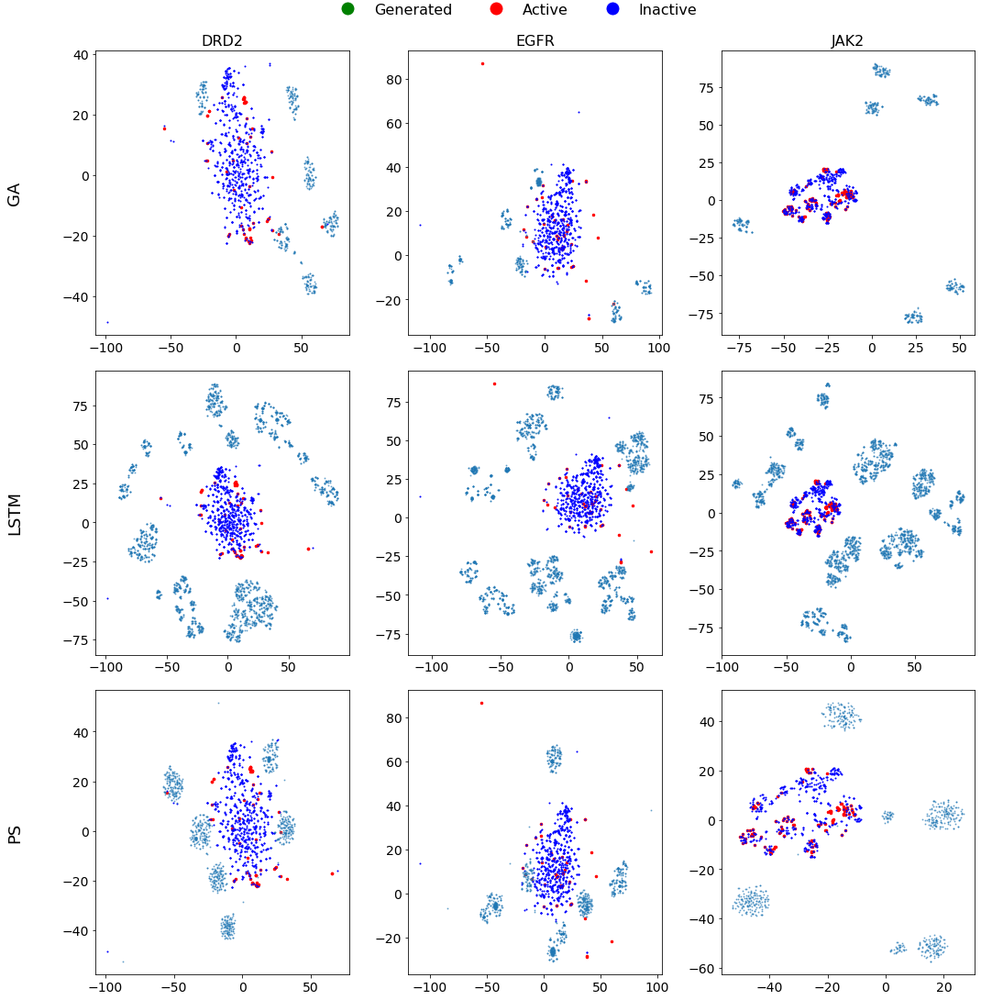

In [ ]:
import seaborn as sns
import scipy.stats as st
from utils import ecfp
from sklearn.metrics import pairwise_distances
from sklearn.manifold import TSNE
name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
nrows = len(optimizers)
ncols = len(chids) # one column for four different iterations
n_runs = 6 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

# `scatter` controls whether or not to plot OS / DCS on 
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15), sharey=False, sharex=False)

for col, chid in enumerate(chids):
    for row, optimizer in enumerate(optimizers):
        ax = axes[row][col]
        chid_dir = results_dir/optimizer/chid
        _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)

        X_active = all_tasks_emb[chid]["active"]
        X_inactive = all_tasks_emb[chid]["inactive"]
        X_generated = all_tasks_emb[chid][f"{optimizer}_x_generated"]
        ax.plot(X_active[:,0], X_active[:,1],'o', markersize=2.5, c='red', alpha=1, label='Active', rasterized=True)
        ax.plot(X_inactive[:,0], X_inactive[:,1], 'o', markersize=1, c='blue',alpha=1, label='Inactive', rasterized=True)
        ax.plot(X_generated[:,0], X_generated[:,1],'o',rasterized=True, markersize=1, alpha=0.5, c=opt)
        
# for ax in axes[-1]:
#     ax.set_xlabel('logP')

# for ax_row in axes:
#     ax_row[0].set_ylabel('MW')

for col, chid in enumerate(chids):
    axes[0][col].set_title(chid2name[chid], size=16)

text_fields = []
for row, optimizer in enumerate(optimizers):
    ax = axes[row][0]
    txt = ax.text(-0.35, 0.5 , opt_dict[optimizer], rotation=90, verticalalignment='center', transform=ax.transAxes, fontsize=18)
    text_fields.append(txt)
#     axes[0][1].legend(ncol=3, loc='upper center', bbox_to_anchor=(0.5,1.3))

#     custom_lines = [Line2D([0], [0], color=color, lw=3, marker='o') for color in ]
#     fig.tight_layout()
#     lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3, frameon=False, fontsize=16, handlelength=3, loc='upper center', bbox_to_anchor=(0.5,1.02))
legend_elements = [Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=15) for color, label in zip(['Green', 'Red', 'Blue'], ['Generated', 'Active', 'Inactive'])]
lgd = fig.legend(handles=legend_elements, ncol=3, frameon=False, fontsize=16,loc='upper center', bbox_to_anchor=(0.52,1.02) )

#     lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3,  handlelength=3,)

plt.tight_layout()    

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(30, 10), sharey=False, sharex=False)
opt_color = {
    'GA': 'orange',
    'LSTM': 'green',
    'PS': 'purple',
    'Active': 'red',
    'Inactive': 'blue'}

for ax, (chid, X_dict) in zip(axes, all_tasks_emb.items()):
    for name, X in X_dict.items():
        opt_verb, typ = name.split('_x_')
        opt = opt_dict[opt_verb]
        if typ == 'active': col = 'red'
        elif typ == 'inactive': col = 'blue'
        else:
            col = opt_color[opt]
            
        markersize = 3 if typ == 'active' else 1
        ax.plot(X[:,0], X[:,1],'o', markersize=markersize, c=col, alpha=1, rasterized=True)

for col, chid in enumerate(chids):
    axes[col].set_title(chid2name[chid], size=16)

legend_elements = [Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=15) for color, label in zip(opt_color.values(), opt_color.keys())]
lgd = fig.legend(handles=legend_elements, ncol=5, frameon=False, fontsize=16,loc='upper center', bbox_to_anchor=(0.52,1.02) )

#     lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3,  handlelength=3,)

plt.tight_layout()    

graph_ga CHEMBL1909140
lstm_hc CHEMBL1909140
mso CHEMBL1909140
mso CHEMBL1909140
mso CHEMBL1909140
graph_ga CHEMBL1909203
lstm_hc CHEMBL1909203
mso CHEMBL1909203
mso CHEMBL1909203
mso CHEMBL1909203
graph_ga CHEMBL3888429
lstm_hc CHEMBL3888429
mso CHEMBL3888429
mso CHEMBL3888429
mso CHEMBL3888429


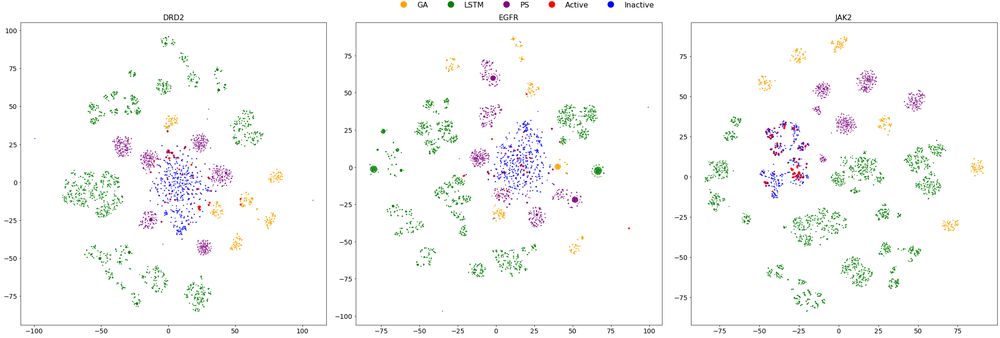

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(30, 10), sharey=False, sharex=False)
opt_color = {
    'GA': 'orange',
    'LSTM': 'green',
    'PS': 'purple',
    'Active': 'red',
    'Inactive': 'blue'}

for ax, (chid, X_dict) in zip(axes, all_tasks_emb.items()):
    for name, X in X_dict.items():
        opt_verb, typ = name.split('_x_')
        opt = opt_dict[opt_verb]
        if typ == 'active': col = 'red'
        elif typ == 'inactive': col = 'blue'
        else:
            col = opt_color[opt]
            
        markersize = 3 if typ == 'active' else 1
        ax.plot(X[:,0], X[:,1],'o', markersize=markersize, c=col, alpha=1, rasterized=True)

for col, chid in enumerate(chids):
    axes[col].set_title(chid2name[chid], size=16)

legend_elements = [Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=15) for color, label in zip(opt_color.values(), opt_color.keys())]
lgd = fig.legend(handles=legend_elements, ncol=5, frameon=False, fontsize=16,loc='upper center', bbox_to_anchor=(0.52,1.02) )

#     lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3,  handlelength=3,)

plt.tight_layout()    

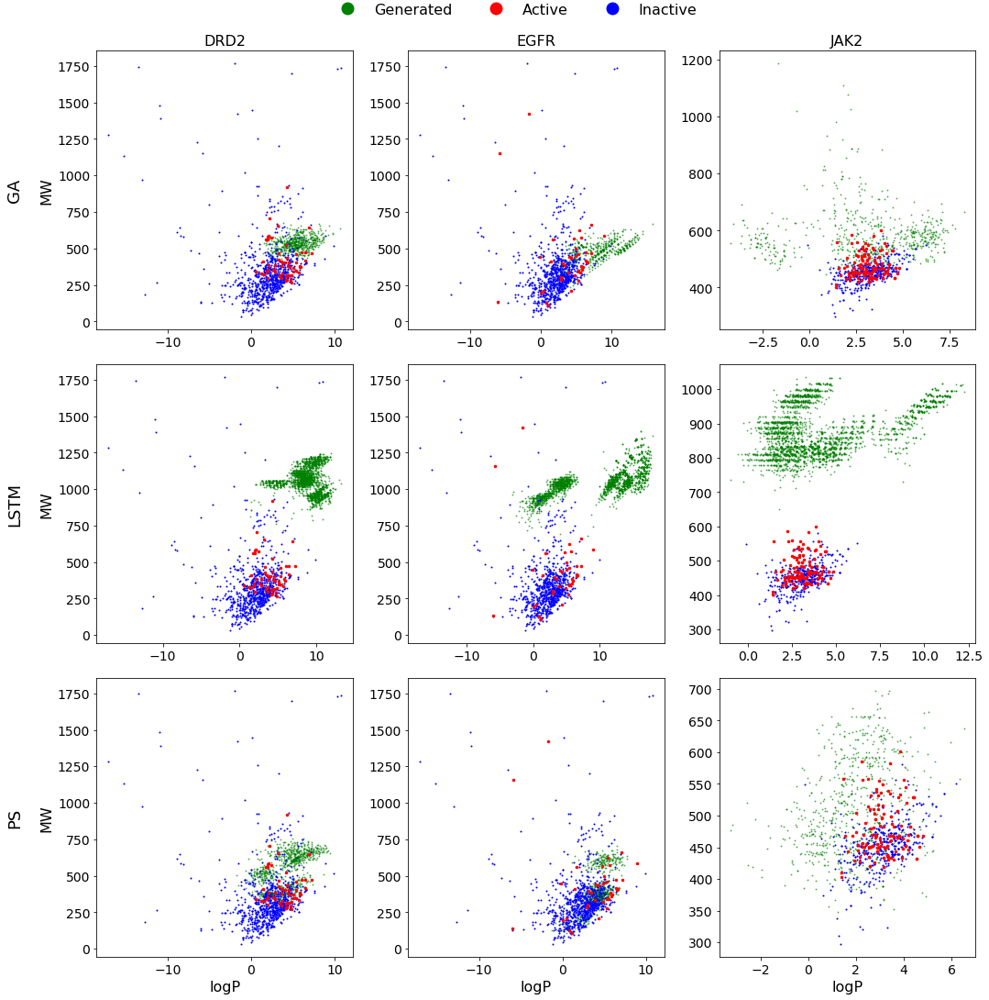

In [ ]:
            logps = [cache_logp(s) for s in smiles_ri]
            mws = [cache_mw(s) for s in smiles_ri]
            label = 'Generated' if run==0 else None
            ax.plot(logps,mws,'o',rasterized=True, markersize=1, alpha=0.5, c='green', label=label)

        si = split_info[0]
        active_smiles = list(si[si.label==1]['smiles'])
        inactive_smiles = list(si[si.label==0]['smiles'])

        inact_dict[chid2name[chid]] = inactive_smiles

        active_logp =  [cache_logp(s) for s in active_smiles]
        inactive_logp =  [cache_logp(s) for s in inactive_smiles]

        active_mws = [cache_mw(s) for s in active_smiles]
        inactive_mws =  [cache_mw(s) for s in inactive_smiles]


        ax.plot(inactive_logp, inactive_mws,'o', markersize=1, c='blue', alpha=1, rasterized=True)
        ax.plot(active_logp, active_mws,'o', markersize=2.5, c='red',alpha=1, rasterized=True)

        # plot appearance and label
#             ax.set_xlim((0,1))
#             ax.set_ylim((0,1))
#             ax.set_xticks(np.linspace(0,1,6))
#             ax.set_yticks(np.linspace(0,1,6))

for ax in axes[-1]:
    ax.set_xlabel('logP')

for ax_row in axes:
    ax_row[0].set_ylabel('MW')

for col, chid in enumerate(chids):
    axes[0][col].set_title(chid2name[chid], size=16)

text_fields = []
for row, optimizer in enumerate(optimizers):
    ax = axes[row][0]
    txt = ax.text(-0.35, 0.5 , opt_dict[optimizer], rotation=90, verticalalignment='center', transform=ax.transAxes, fontsize=18)
    text_fields.append(txt)
#     axes[0][1].legend(ncol=3, loc='upper center', bbox_to_anchor=(0.5,1.3))

#     custom_lines = [Line2D([0], [0], color=color, lw=3, marker='o') for color in ]
#     fig.tight_layout()
#     lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3, frameon=False, fontsize=16, handlelength=3, loc='upper center', bbox_to_anchor=(0.5,1.02))
legend_elements = [Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=15) for color, label in zip(['Green', 'Red', 'Blue'], ['Generated', 'Active', 'Inactive'])]
lgd = fig.legend(handles=legend_elements, ncol=3, frameon=False, fontsize=16,loc='upper center', bbox_to_anchor=(0.52,1.02) )

#     lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3,  handlelength=3,)

plt.tight_layout()    
if write and False:
    plt.savefig(f'{figure_dir}/logp_MW_{itername}.pdf', dpi=300, bbox_extra_artists=[lgd]+text_fields, bbox_inches='tight')
plt.show()

In [ ]:
scores_all = {}
for row, (score_name, score_fun) in enumerate(scoring_functions.items()):
    scores_chid = {}
    for col, chid in enumerate(chids):
        
        scores_optimizer = {}
        for optimizer in optimizers:
            chid_dir = results_dir/optimizer/chid
            # get smiles for optimized molecules
            _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)

            scores = []
            for smiles_run in smiles:
                scores_run = []
                for smiles_it in smiles_run:
                    sco = [score_fun(s) for s in smiles_it[:100]]
                    scores_mean = np.mean([s for s in sco if s is not None])
                    scores_run.append(scores_mean)
                scores.append(scores_run)
            
            scores = np.array(scores)
            if score_name == 'Diversity':
                scores = diversity_scores[chid][optimizer]
            
            scores_optimizer[optimizer] = scores
            
            median = np.median(scores, 0)
            q25 = np.percentile(scores, 25, 0)
            q75 = np.percentile(scores, 75, 0)
            ax.plot(median, color=opt_cols[optimizer], ls=ls_opt[optimizer])
            ax.fill_between(np.arange(median.shape[0]), q25, q75, alpha=.1, color=opt_cols[optimizer])
        
        scores_chid[chid] = scores_optimizer
    scores_all[score_name] = scores_chid

In [ ]:
from utils import ecfp
from sklearn.metrics import pairwise_distances
from collections import defaultdict

# diversity_scores = defaultdict(dict)


for col, chid in enumerate(chids):
    chid_scores = {}
    for optimizer in optimizers:
        if optimizer in diversity_scores[chid]:
            continue
            
        chid_dir = results_dir/optimizer/chid
        print(chid_dir)
        # get smiles for optimized molecules
        _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)
        
        
        scores = []
        for smiles_run in smiles:
            scores_run = []
            for it, smiles_it in enumerate(smiles_run):
                ecfp_valid = [s for s in ecfp(smiles_it[:200]) if s is not None]
                ecfp_valid = ecfp_valid[:100]
                scores_mean = pairwise_distances(np.array(ecfp_valid), metric='jaccard', n_jobs=5).mean()
                scores_run.append(scores_mean)
            scores.append(scores_run)
        
        scores = np.array(scores)
        diversity_scores[chid][optimizer] = scores

results/goal_directed_paper/mso/CHEMBL1909140
results/goal_directed_paper/graph_ga/CHEMBL1909203
results/goal_directed_paper/lstm_hc/CHEMBL1909203
results/goal_directed_paper/mso/CHEMBL1909203
results/goal_directed_paper/graph_ga/CHEMBL3888429
results/goal_directed_paper/lstm_hc/CHEMBL3888429
results/goal_directed_paper/mso/CHEMBL3888429


In [ ]:
diversity_scoresy_scoresy_scoresy_scoresv1 in diversity_scores.items():
    print(k1, v1.keys())

CHEMBL1909140 dict_keys(['graph_ga', 'lstm_hc', 'mso'])
CHEMBL1909203 dict_keys(['graph_ga', 'lstm_hc', 'mso'])
CHEMBL3888429 dict_keys(['graph_ga', 'lstm_hc', 'mso'])


In [ ]:
scores_all['Diversity'] = diversity_scores

In [ ]:
import pickle
with open(os.path.join(results_dir, 'additional_scores.p'), 'wb') as f:
    pickle.dump(scores_all, f)

In [ ]:
from sklearn.neighbors import NearestNeighbors
def get_dists(X, Y):
    neigh = NearestNeighbors(10, 0.4, metric='jaccard', algorithm='brute')
    neigh.fit(X)
    dist, idx = neigh.kneighbors(Y)
    return dist, idx

# dist, idx = get_dists(ecfp_s1, ecfp_s0)

In [ ]:
from utils import ecfp
from sklearn.metrics import pairwise_distances
from collections import defaultdict
from tqdm import tqdm 

nn_train_active_all = defaultdict(dict)
nn_train_inactive_all = defaultdict(dict)

for col, chid in enumerate(chids):
    for optimizer in optimizers:
        chid_dir = results_dir/optimizer/chid
        print(chid_dir)
        # get smiles for optimized molecules
        _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)
        
        nn_train_active = []
        nn_train_inactive = []
        
        for smiles_run, si in zip(smiles, split_info):
            active_train_ecfp = np.array(ecfp(list(si[np.logical_and(si.Split==0, si.label==1)]['smiles'])))
            inactive_train_ecfp = np.array(ecfp(list(si[np.logical_and(si.Split==0, si.label==0)]['smiles'])))
            
            nn_train_active_run = []
            nn_train_inactive_run = []
            for it, smiles_it in tqdm(enumerate(smiles_run)):
                gen_ecfp = np.array(ecfp([s for s in smiles_it[:200] if Chem.MolFromSmiles(s) is not None][:100]))
                active_nn, _ = get_dists(active_train_ecfp, gen_ecfp)
                inactive_nn, _ = get_dists(inactive_train_ecfp, gen_ecfp)
                
                nn_train_active_run.append(active_nn[:,0].mean())
                nn_train_inactive_run.append(inactive_nn[:,0].mean())
                
            nn_train_active.append(nn_train_active_run)
            nn_train_inactive.append(nn_train_inactive_run)
        
        nn_train_active = np.array(nn_train_active)
        nn_train_inactive = np.array(nn_train_inactive)
        
        
        nn_train_active_all[chid][optimizer] = nn_train_active
        nn_train_inactive_all[chid][optimizer] = nn_train_inactive

results/goal_directed_paper/graph_ga/CHEMBL1909140


151it [00:59,  2.54it/s]
151it [01:01,  2.47it/s]
151it [00:59,  2.54it/s]
151it [01:00,  2.50it/s]
151it [00:57,  2.61it/s]
151it [01:00,  2.49it/s]
151it [00:59,  2.53it/s]
151it [01:03,  2.39it/s]
151it [01:00,  2.51it/s]
151it [00:59,  2.55it/s]

results/goal_directed_paper/lstm_hc/CHEMBL1909140



151it [01:11,  2.11it/s]
151it [01:12,  2.09it/s]
151it [01:09,  2.16it/s]
151it [01:11,  2.10it/s]
151it [01:06,  2.27it/s]
151it [01:06,  2.27it/s]
151it [01:12,  2.09it/s]
151it [01:11,  2.11it/s]
151it [01:03,  2.36it/s]
151it [01:08,  2.21it/s]

results/goal_directed_paper/mso/CHEMBL1909140



151it [00:54,  2.75it/s]
151it [00:59,  2.52it/s]
151it [00:58,  2.59it/s]
151it [01:01,  2.46it/s]
151it [01:00,  2.49it/s]
151it [01:00,  2.49it/s]
151it [00:54,  2.76it/s]
151it [01:00,  2.51it/s]
151it [01:00,  2.50it/s]
151it [01:01,  2.46it/s]

results/goal_directed_paper/graph_ga/CHEMBL1909203



151it [00:57,  2.62it/s]
151it [00:53,  2.81it/s]
151it [00:55,  2.72it/s]
151it [00:59,  2.53it/s]
151it [00:55,  2.70it/s]
151it [00:55,  2.74it/s]
151it [00:55,  2.73it/s]
151it [00:56,  2.66it/s]
151it [00:55,  2.72it/s]
151it [00:57,  2.61it/s]

results/goal_directed_paper/lstm_hc/CHEMBL1909203



151it [01:05,  2.32it/s]
151it [01:04,  2.35it/s]
151it [01:08,  2.21it/s]
151it [01:08,  2.22it/s]
151it [01:00,  2.48it/s]
151it [01:02,  2.42it/s]
151it [01:02,  2.43it/s]
151it [01:00,  2.51it/s]
151it [01:06,  2.27it/s]
151it [01:04,  2.35it/s]

results/goal_directed_paper/mso/CHEMBL1909203



151it [00:57,  2.64it/s]
151it [01:00,  2.51it/s]
151it [00:56,  2.69it/s]
151it [00:57,  2.61it/s]
151it [00:58,  2.58it/s]
151it [00:55,  2.74it/s]

results/goal_directed_paper/graph_ga/CHEMBL3888429



151it [00:58,  2.60it/s]
151it [00:56,  2.65it/s]
151it [00:58,  2.57it/s]
151it [01:00,  2.48it/s]
151it [00:56,  2.69it/s]
151it [00:55,  2.70it/s]
151it [00:57,  2.60it/s]
151it [00:58,  2.59it/s]
151it [00:59,  2.52it/s]
151it [00:59,  2.54it/s]

results/goal_directed_paper/lstm_hc/CHEMBL3888429



151it [01:01,  2.45it/s]
151it [01:01,  2.44it/s]
151it [01:01,  2.46it/s]
151it [01:04,  2.34it/s]
151it [01:06,  2.27it/s]
151it [01:05,  2.30it/s]
151it [01:06,  2.28it/s]
151it [01:00,  2.49it/s]
151it [00:58,  2.57it/s]
151it [00:57,  2.61it/s]

results/goal_directed_paper/mso/CHEMBL3888429



151it [00:52,  2.90it/s]
151it [00:52,  2.90it/s]
151it [00:55,  2.73it/s]
151it [00:55,  2.70it/s]
151it [00:56,  2.68it/s]
151it [00:54,  2.75it/s]
151it [00:55,  2.70it/s]
151it [00:54,  2.77it/s]
151it [00:55,  2.74it/s]
151it [00:54,  2.76it/s]


In [ ]:
print(nn_train_active)

In [ ]:
# scores_all['NN act'] = nn_train_active_all
scores_all['NN ina'] = nn_train_inactive_all

import pickle
with open(os.path.join(results_dir, 'additional_scores.p'), 'wb') as f:
    pickle.dump(scores_all, f)

In [ ]:
import pickle
with open(os.path.join(results_dir, 'additional_scores.p'), 'rb') as f:
    scores_all = pickle.load(f)

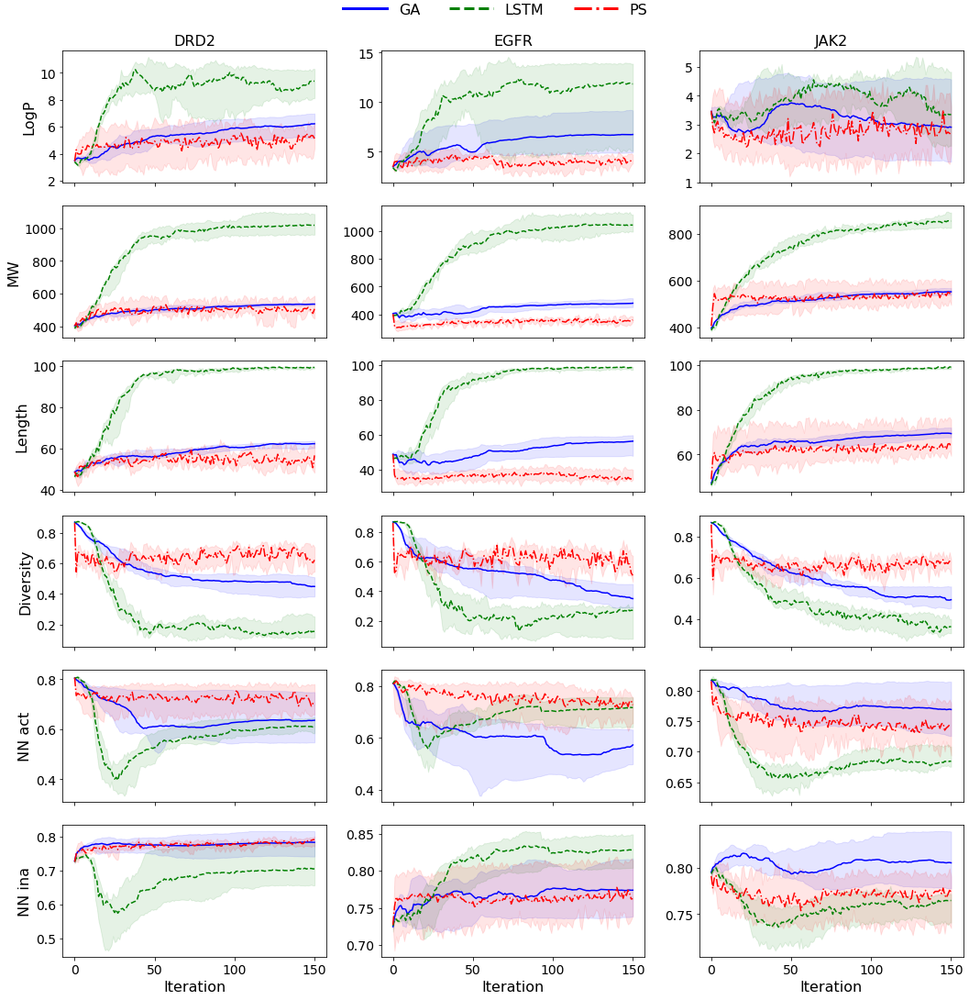

In [ ]:
import seaborn as sns
import scipy.stats as st
from utils import ecfp
from sklearn.metrics import pairwise_distances

name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
ncols = 4 # one column for four different iterations
n_runs = 6 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)


opt_cols = {'graph_ga': 'blue',
            'lstm_hc': 'green',
            'mso': 'red'}

scoring_functions = {'LogP': cache_logp,
                     'MW': cache_mw,
                     'Length': len,
                     'Diversity': lambda x: 0}

ls_opt = dict(zip(optimizers, ls_dict.values()))


fig, axes = plt.subplots(nrows=len(scores_all), ncols=3, figsize=(15, 2.5 * len(scores_all)), sharex=True)

for row, score_name in enumerate(scores_all):
    for col, chid in enumerate(chids):
        ax = axes[row][col]
        for optimizer in optimizers:
            try:
                scores = scores_all[score_name][chid][optimizer]

                median = np.median(scores, 0)
                q25 = np.percentile(scores, 25, 0)
                q75 = np.percentile(scores, 75, 0)
                ax.plot(median, color=opt_cols[optimizer], ls=ls_opt[optimizer])
                ax.fill_between(np.arange(median.shape[0]), q25, q75, alpha=.1, color=opt_cols[optimizer])
                
            except:
                pass

    axes[row][0].set_ylabel(score_name)
for col in range(3):
    axes[-1][col].set_xlabel('Iteration')
    
for col, chid in enumerate(chids):
    axes[0][col].set_title(chid2name[chid], size=16)

# create legend
custom_lines = [Line2D([0], [0], color=opt_cols[k], lw=3, ls=ls_opt[k]) for k in opt_cols.keys()]
fig.tight_layout()
lgd = fig.legend(custom_lines, list(opt_dict.values()), ncol=3, frameon=False, fontsize=16, handlelength=3, loc='upper center', bbox_to_anchor=(0.5,1.02))

if write or True:
    plt.savefig(f'{figure_dir}/additional_properties.pdf', bbox_extra_artists=(lgd,), bbox_inches='tight')

In [ ]:
figure_dir

PosixPath('figures')

In [ ]:
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)

[('si', 97995),
 ('assay_data', 87451),
 ('e1', 24096),
 ('e2', 24096),
 ('rcParams', 9344),
 ('label', 5496),
 ('inactive_logp', 4856),
 ('inactive_mws', 4856),
 ('inactive_smiles', 4856),
 ('a1', 1480),
 ('a2', 1480),
 ('smiles_run', 1456),
 ('assay_info', 1419),
 ('active_smiles', 1376),
 ('logps', 1304),
 ('mws', 1304),
 ('active_logp', 1256),
 ('active_mws', 1256),
 ('smiles_ri', 1080),
 ('table', 1007),
 ('Line2D', 896),
 ('Path', 896),
 ('assay_stats', 884),
 ('lt', 542),
 ('defaultdict', 400),
 ('perf', 386),
 ('chid2name', 376),
 ('name2chid', 376),
 ('auc_df', 314),
 ('results', 256),
 ('auc', 248),
 ('aucs', 248),
 ('bm', 248),
 ('col_dict', 248),
 ('col_dict2', 248),
 ('legend_dict', 248),
 ('ls_dict', 248),
 ('opt_dict', 248),
 ('params', 248),
 ('preds_external', 248),
 ('preds_internal', 248),
 ('row', 248),
 ('trainset_predictions', 248),
 ('split1', 200),
 ('split2', 200),
 ('f', 184),
 ('cache_logp', 160),
 ('cache_mfs', 160),
 ('cache_mw', 160),
 ('load_chid', 160),


lstm_hc
results/goal_directed_paper/lstm_hc/CHEMBL1909140


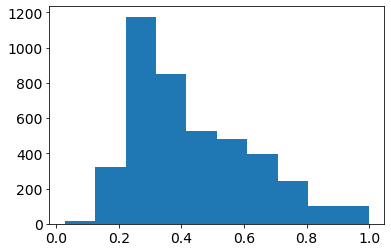

results/goal_directed_paper/lstm_hc/CHEMBL1909203


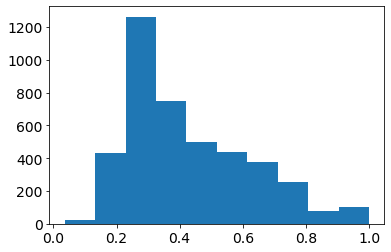

results/goal_directed_paper/lstm_hc/CHEMBL3888429


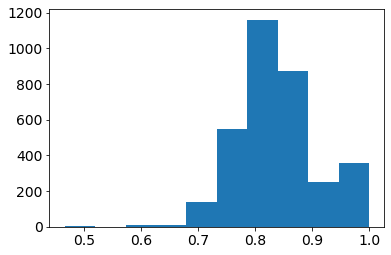

In [ ]:
import seaborn as sns
import scipy.stats as st

name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
ncols = 4 # one column for four different iterations
n_runs = 10 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

# `scatter` controls whether or not to plot OS / DCS on 

from utils import ecfp

optimizer='lstm_hc'

nn_dict = {}
print(optimizer)
for chid in chids:
    chid_dir = results_dir/optimizer/chid
    print(chid_dir)

    # get predictions for optimized molecules
    _,_,_, smiles, split_info = load_chid(results_dir/optimizer/chid, order)
    # plot optimized molecules
    all_dist = []
    for run in range(n_runs):
        si = split_info[run]
        split0 = list(si[si.Split==0]['smiles'])
        split1 = list(si[si.Split==1]['smiles'])

        ecfp_s0 = np.array(ecfp(split0))
        ecfp_s1 = np.array(ecfp(split1))

        dist, idx = get_dists(ecfp_s0, ecfp_s1)
        all_dist += list(1-dist[:,0])
    
    nn_dict[chid] = {'AssayID': chid,
                     'Assay': chid2name[chid],
                    'Mean': np.mean(all_dist),
                    'Median': np.median(all_dist),
                    'Std': np.std(all_dist),
                    'p25': np.percentile(all_dist, 25),
                    'p75': np.percentile(all_dist, 75),
                    'all': all_dist}
    plt.hist(all_dist)
    plt.show()


nn_df = pd.DataFrame(nn_dict)
nn_df = nn_df.transpose()
nn_df.index = range(len(nn_df))

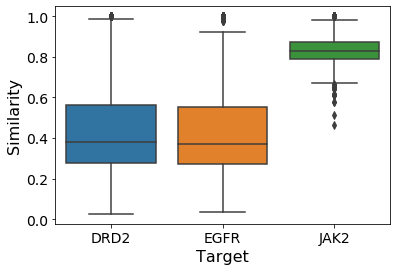

In [ ]:
nn_similarities = []
for k, v in nn_dict.items():
    name = chid2name[k]
    sims = v['all']
    for s in sims:
        nn_similarities.append({'Target': name, 'Similarity': s})

nn_df = pd.DataFrame(nn_similarities)
import seaborn as sns
sns.boxplot(x='Target', y='Similarity', data=nn_df)
if write or True:
    plt.savefig(figure_dir/'NN_train_test.pdf', bbox_inches='tight')

# Visualize the molecules

In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display, SVG, HTML
from pathlib import Path
from collections import defaultdict

# read "real" molecules and optimized molecules
assay_root = Path('assays/processed/')
smiles_dict = defaultdict(dict)
for chid in chids:
    print(chid2name[chid])
    name = chid2name[chid]
    
    file = f"{assay_root/chid}.csv"
    df = pd.read_csv(file)
        
    # set random seed for reproducibility of compound choice
    for optimizer in ['graph_ga', 'lstm_hc', 'mso']:
        
        chid_dir = results_dir/optimizer/chid
        preds_internal, preds_external, aucs, all_smiles, _ = load_chid(results_dir/optimizer/chid, order)
        
        smiles_dict[name][optimizer] = [s for run in all_smiles for s in run[-1]]
    smiles_dict[name]['real'] = df[df.label==1].smiles
    

RDKit WARNING: [14:06:03] Enabling RDKit 2019.09.1 jupyter extensions


NameError: name 'chids' is not defined

## Draws molecules into a constant sized images
I scale up the font size for large molecules to make the fonts readable for large molecules

In [ ]:
import cairosvg
import rdkit
from rdkit import Chem, Geometry
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import IPythonConsole, rdMolDraw2D
import cairosvg

def get_dist(m):
    AllChem.Compute2DCoords(m)

    coords = m.GetConformer(-1).GetPositions()
    min_x, min_y = coords.min(0)[:2]
    max_x, max_y = coords.max(0)[:2]
    
    x_dist = max_x - min_x + 0.5
    y_dist = max_y - min_y + 0.5
    return x_dist, y_dist

In [ ]:
# print(get_dist(Chem.MolFromSmiles('CC')))

def draw_constant_size(m, x_size=500, y_size=300):
    """When plotting a large molecule in a constant sized image the atom labels get really small.
    This is because the atom labels are scaled with the bond lengths (physical size).
    This can be solved by scaling up the font size the same amount the bond length is shortened
    This breaks when molecules get too large though as the atom labels will dominate the plots.
    """
    # get width / height in Angstrom (?)
    x_dist, y_dist = get_dist(m)
    
    # get dots per angstrom
    x_dpa = x_size / x_dist
    y_dpa = y_size / y_dist
    
    """
    if dpa are low in one dimension the bond length in dots will be low
    This means that font size will appear low in final plot.
    Therefore scale up font size with the minimum of the two values.
    """
    scale = min(x_dpa, y_dpa)
    fs = 14 / scale
    
    # the above doesn't work if the molecules are very small. The font size will become too small
    # Therefore correct this. The value of 0.4 is chosen to get a similar font size for all 
    # molecule sizes. I tested this empirically.
    fs = max(fs, 0.4)
    AllChem.Compute2DCoords(m)
    d = rdMolDraw2D.MolDraw2DSVG(x_size, y_size) # or MolDraw2DCairo to get PNGs
    d.SetFontSize(fs)
    d.DrawMolecule(m)

    d.FinishDrawing()
    return d


plot_dir = Path(f'{figure_dir}/molplots')
print(plot_dir)
os.makedirs(plot_dir, exist_ok=True)
os.makedirs(plot_dir/'svg', exist_ok=True)
os.makedirs(plot_dir/'pdf', exist_ok=True)

np.random.seed(42)
x_size, y_size = 500, 300
mols_per_cat = 6
imgs = []
for name, smiles_cat in smiles_dict.items():
    for cat, smiles in smiles_cat.items():
        print(name, cat)
        sub = np.random.choice(smiles, mols_per_cat)
        for i, s in enumerate(sub):
            m = Chem.MolFromSmiles(s)
            
            d = draw_constant_size(m)
            img = d.GetDrawingText()
            imgs.append(img)
            
            if write and False:
                fn = '_'.join([name, cat, str(i)])+'.svg'
                svgfile = plot_dir/'svg'/fn
                with open(svgfile, 'w') as f:
                    f.write(img)
                cairosvg.svg2pdf(url=str(svgfile), write_to=str(svgfile).replace('svg', 'pdf'))


HTML(''.join([f'{i}' for i in imgs]))

figures/molplots
DRD2 graph_ga
DRD2 lstm_hc
DRD2 mso
DRD2 real
EGFR graph_ga
EGFR lstm_hc
EGFR mso
EGFR real
JAK2 graph_ga
JAK2 lstm_hc
JAK2 mso
JAK2 real


# Additional plots not in the paper

## This draws molecules with a constant bond length.

In [ ]:
import cairosvg

def draw_scale(m, dpa=20, fs=0.7):
    """Draw a molecule and increase image size depending on molecule size"""
    m = Chem.MolFromSmiles(s)
    x_dist, y_dist = get_dist(m)

    AllChem.Compute2DCoords(m)
    d = rdMolDraw2D.MolDraw2DSVG(int(x_dist * dpa), int(y_dist * dpa)) # or MolDraw2DCairo to get PNGs
    d.SetFontSize(fs)
    d.DrawMolecule(m)

    d.FinishDrawing()
    return d

plot_dir = Path(f'{figure_dir}/molplots_scale')
os.makedirs(plot_dir, exist_ok=True)
os.makedirs(plot_dir/'svg', exist_ok=True)
os.makedirs(plot_dir/'pdf', exist_ok=True)

np.random.seed(42)
dpa = 20
mols_per_cat = 40
imgs = []
for name, smiles_cat in smiles_dict.items():
    for cat, smiles in smiles_cat.items():
        print(name, cat)
        sub = np.random.choice(smiles, mols_per_cat)
        for i, s in enumerate(sub):
            d = draw_scale(m)
            img = d.GetDrawingText()
            imgs.append(img)
            
            if write:
                fn = '_'.join([name, cat, str(i)])+'.svg'
                svgfile = plot_dir/'svg'/fn
                with open(svgfile, 'w') as f:
                    f.write(img)
                cairosvg.svg2pdf(url=str(svgfile), write_to=str(svgfile).replace('svg', 'pdf'))


HTML(''.join([f'{i}' for i in imgs]))

DRD2 graph_ga
DRD2 lstm_hc
DRD2 mso
DRD2 real
EGFR graph_ga
EGFR lstm_hc
EGFR mso
EGFR real
JAK2 graph_ga
JAK2 lstm_hc
JAK2 mso
JAK2 real


## Results including single runs

results/goal_directed_paper/graph_ga/CHEMBL1909140
results/goal_directed_paper/graph_ga/CHEMBL1909203
results/goal_directed_paper/graph_ga/CHEMBL3888429


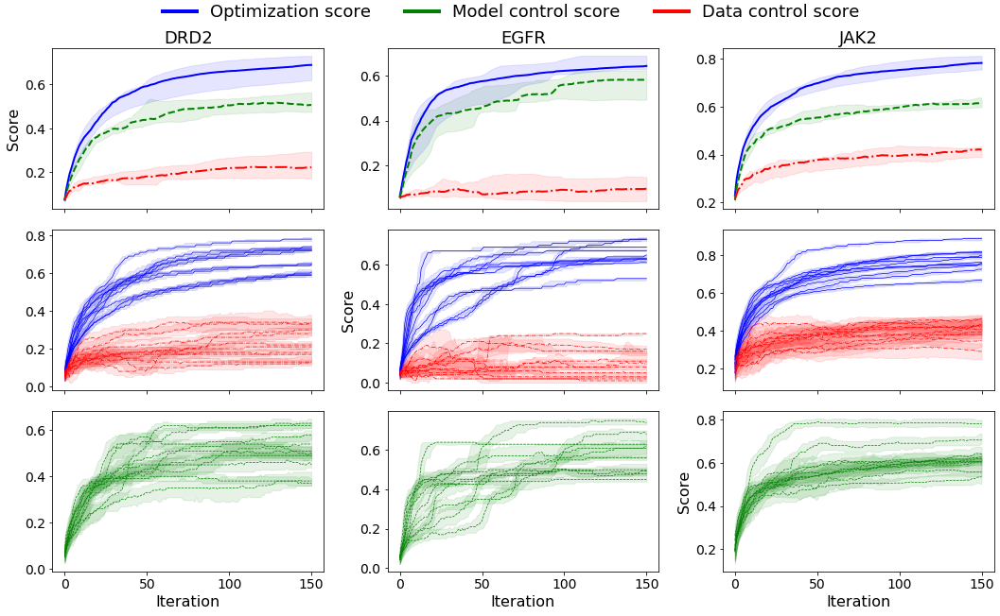

results/goal_directed_paper/lstm_hc/CHEMBL1909140
results/goal_directed_paper/lstm_hc/CHEMBL1909203
results/goal_directed_paper/lstm_hc/CHEMBL3888429


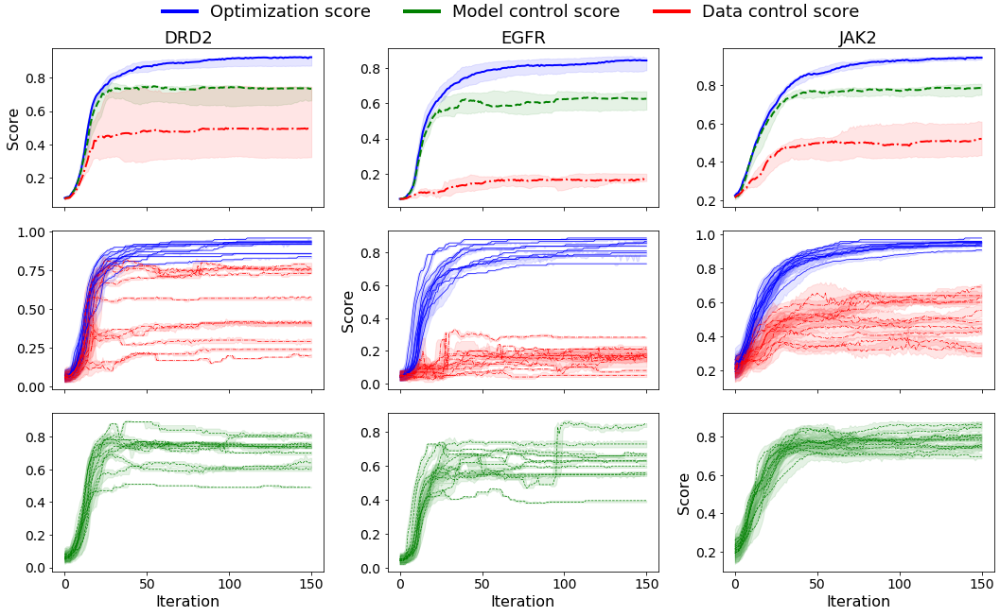

results/goal_directed_paper/mso/CHEMBL1909140


TypeError: '<' not supported between instances of 'NoneType' and 'float'

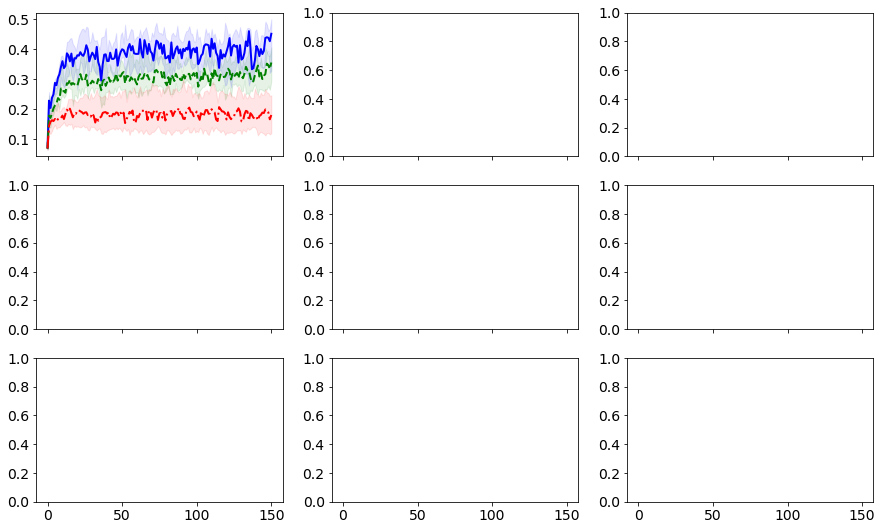

In [ ]:
nrows=3
ncols = len(chids)

for optimizer in optimizers:
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 9), sharex=True)

    # store aucs while looping
    aucs = {}
    for i, chid in enumerate(chids):
        print(results_dir/optimizer/chid)

        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)
        aucs[chid] = auc

        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound',
                     col_dict=col_dict, legend_dict=legend_dict, skip=[], ax=axes[0][i], legend=False, lw=2, ls_dict=ls_dict)
        plot_wrapper(preds_internal, median_score_single, name='median_score_single',
                     col_dict=col_dict, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[1][i], legend=False, lw=0.7, ls_dict=ls_dict)

        plot_wrapper(preds_internal, median_score_single, name='median_score_single',
                     col_dict=col_dict, legend_dict=legend_dict, skip=['Split1','Split2'], ax=axes[2][i], legend=False, lw=0.7,ls_dict=ls_dict)

    # set axis labels
    for i in range(ncols):
        axes[-1][i].set_xlabel('Iteration')

    for i in range(nrows):
        axes[i][i].set_ylabel('Score')

    #set legend and titles
    for i, chid in enumerate(chids):
        axes[0][i].set_title(chid2name[chid], fontsize=18)
    custom_lines = [Line2D([0], [0], color=color, lw=4) for color in col_dict.values()]
    fig.legend(custom_lines, list(legend_dict.values()), loc='upper center',
               ncol=3, bbox_to_anchor=(0.5, 1.025), frameon=False)
    fig.tight_layout()
    plt.show()

# Comparison of LSTM and GA

results/goal_directed_paper/lstm_hc/CHEMBL1909140
results/goal_directed_paper/lstm_hc/CHEMBL3888429
results/goal_directed_paper/lstm_hc/CHEMBL1909203
results/goal_directed_paper/graph_ga/CHEMBL1909140
results/goal_directed_paper/graph_ga/CHEMBL3888429
results/goal_directed_paper/graph_ga/CHEMBL1909203


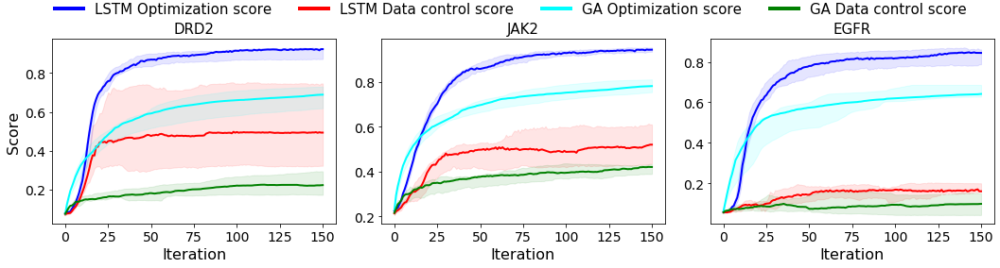

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(chids), figsize=(15, 4), sharex=True)

for ridx, (optimizer, cd) in enumerate(zip(['lstm_hc', 'graph_ga'], [col_dict, col_dict2])):
    for i, chid in enumerate(chids):
        print(results_dir/optimizer/chid)

        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)
        
        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', col_dict=cd, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[i], legend=False, lw=2, ls_dict=defaultdict(lambda: None))

axes[0].set_ylabel('Score')
for ax in axes:
    ax.set_xlabel('Iteration')
    
for i, chid in enumerate(chids):
    axes[i].set_title(chid2name[chid], fontsize=15)

def interleave(l1, l2):
    return [val for pair in zip(l1, l2) for val in pair]

lstm_lines = [Line2D([0], [0], color=color, lw=4) for k, color in col_dict.items() if k!='Split1_alt']
ga_lines = [Line2D([0], [0], color=color, lw=4) for k, color in col_dict2.items() if k!='Split1_alt']
lines = lstm_lines+ga_lines
# lines = interleave(lstm_lines, ga_lines)

lstm_names = [f'LSTM {v}' for k, v in legend_dict.items() if k!='Split1_alt']
ga_names = [f'GA {v}' for k, v in legend_dict.items() if k!='Split1_alt']
names = lstm_names + ga_names
# names = interleave(lstm_names, ga_names)

fig.legend(lines, names, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.025), frameon=False, fontsize=15)

fig.tight_layout()
if write:
    plt.savefig(f'{figure_dir}/ga_lstm_comparison.pdf')

# KDE animations

In [ ]:
# This may take a while
# Make kernel density plots over the iterations
import seaborn as sns
from multiprocessing import Pool

def make_kde_series(optimizer, chid):
    alpha=0.3
    n_ext = 1000
    
    # load predictions
    preds_internal, preds_external, auc,_ ,_ = load_chid(results_dir/optimizer/chid, order)
    pred1 = preds_internal['Split1']
    pred2 = preds_internal['Split2']
    pred1_ext = preds_external['Split1']
    pred2_ext = preds_external['Split2']

    # create directory
    kde_dir = Path(f'{figure_dir}/kde/{chid}_{optimizer}')
    os.makedirs(kde_dir, exist_ok=True)
    
    # check if all runs have same length
    run_lengths = [len(run) for run in pred1]
    assert all(l == run_lengths[0] for l in run_lengths)

    # make a plot for each iteration
    for it in range(len(pred1[0])):
        for run in range(len(pred1)):
            sns.kdeplot(pred1[run][it], pred2[run][it], shade=True,shade_lowest=False, alpha=0.2)
        sns.kdeplot(pred1_ext[run][:n_ext], pred2_ext[run][:n_ext], shade=True,shade_lowest=False, alpha=0.5, cmap='Greys')
        
        # h/v lines at 0.5
        plt.axvline(0.5, c='black', alpha=alpha)
        plt.axhline(0.5, c='black',alpha=alpha)
        
        # limits and diagonal
        plt.xlim((-0.013,1.013))
        plt.ylim((-0.013,1.013))
        plt.plot((-0.013,1.013), (-0.013,1.013), c='black', alpha=0.4)
        
        # axes labels
        plt.xlabel('Optimizer score')
        plt.ylabel('Control score')
        
        if write:
            plt.savefig(kde_dir/f'{it:03}')
        plt.clf()

optimizers = ['graph_ga', 'lstm_hc']

from itertools import product
with Pool(6) as pool:
    pool.starmap(make_kde_series, product(optimizers, chids))

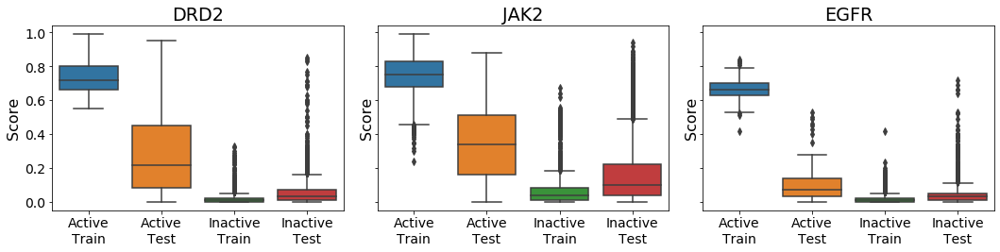

In [ ]:
import scipy.stats as st
import seaborn as sns
import pickle 

with open(results_dir/'predictions.p', 'rb') as f:
    trainset_predictions = pickle.load(f)

fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, 4), sharey=True)

for ax, chid in zip(axes, trainset_predictions.keys()):
    p11s, p21s, p12s, p22s, y1s, y2s = trainset_predictions[chid]

    df_train =  pd.DataFrame({'Score': p11s,
     'Label': ['Active' if l else 'Inactive' for l in y1s],
     'Split': ['Train'] * y1s.shape[0]})
    df_test =  pd.DataFrame({'Score': p12s,
     'Label': ['Active' if l else 'Inactive' for l in y2s],
     'Split': ['Test'] * y2s.shape[0]})

    df = pd.concat([df_train,df_test])
    df['group'] = ['\n'.join([y,x]) for x, y in zip(df.Split, df.Label)]
    df =  df.sort_values('group')
    g = sorted(list(set(df.group)))
    class_order = [g[1], g[0], g[3], g[2]]
    sns.boxplot(x='group', y='Score', data=df, order=class_order,ax=ax)
    ax.set_title(chid2name.get(chid, chid))
    ax.set_xlabel(None)
    plt.tight_layout()

if write or True:
    plt.savefig(f'{figure_dir}/data_biases_boxplot.pdf')
        
plt.show()

## Calculate correlation between the scores

In [ ]:
from scipy.stats import spearmanr, pearsonr

acc_ext = []
acc_int = []
for chid in chids:
    for optimizer in ['graph_ga', 'lstm_hc']:
        chid_dir = results_dir/optimizer/chid
        preds_internal, preds_external, auc, _, _ = load_chid(chid_dir, order)
        
        os = np.concatenate(preds_external['Split1'])
        mcs = np.concatenate(preds_external['Split1_alt'])
        dcs = np.concatenate(preds_external['Split2'])
        os_dcs_spr = spearmanr(os, dcs).correlation
        os_dcs_pr = pearsonr(os, dcs)[0]
        os_mcs_spr = spearmanr(os, mcs).correlation
        os_mcs_pr = pearsonr(os, mcs)[0]
        acc_ext.append([chid2name[chid], optimizer, os_mcs_spr, os_mcs_pr, os_dcs_spr, os_dcs_pr])
        
        os = np.concatenate([s[-1] for s in preds_internal['Split1']])
        mcs = np.concatenate([s[-1] for s in preds_internal['Split1_alt']])
        dcs = np.concatenate([s[-1] for s in preds_internal['Split2']])
#         print(os)
        os_dcs_spr = spearmanr(os, dcs).correlation
        os_dcs_pr = pearsonr(os, dcs)[0]
        os_mcs_spr = spearmanr(os, mcs).correlation
        os_mcs_pr = pearsonr(os, mcs)[0]
        acc_int.append([chid2name[chid], optimizer, os_mcs_spr, os_mcs_pr, os_dcs_spr, os_dcs_pr])
        
        
cols = ['Task', 'Optimizer', 'SpearmanR OS-MCS', 'PearsonR OS-MCS', 'SpearmanR OS-DCS', 'PearsonR OS-DCS']
df_ext = pd.DataFrame(acc_ext)
df_ext.columns = cols
print(df_ext.to_markdown()+'\n')

df_int = pd.DataFrame(acc_int)
df_int.columns = cols
print(df_int.to_markdown())

|    | Task   | Optimizer   |   SpearmanR OS-MCS |   PearsonR OS-MCS |   SpearmanR OS-DCS |   PearsonR OS-DCS |
|---:|:-------|:------------|-------------------:|------------------:|-------------------:|------------------:|
|  0 | DRD2   | graph_ga    |           0.746666 |          0.796201 |           0.399379 |          0.426517 |
|  1 | DRD2   | lstm_hc     |           0.747676 |          0.797169 |           0.394619 |          0.412861 |
|  2 | JAK2   | graph_ga    |           0.752263 |          0.766563 |           0.362045 |          0.36982  |
|  3 | JAK2   | lstm_hc     |           0.754302 |          0.769395 |           0.368276 |          0.374611 |
|  4 | EGFR   | graph_ga    |           0.698443 |          0.758298 |           0.226968 |          0.216318 |
|  5 | EGFR   | lstm_hc     |           0.691547 |          0.757749 |           0.237924 |          0.231584 |

|    | Task   | Optimizer   |   SpearmanR OS-MCS |   PearsonR OS-MCS |   SpearmanR OS-DCS |   PearsonR 

In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display, SVG, HTML

def draw_scale(m, dpa=20, fs=0.7):
    """Draw a molecule and increase image size depending on molecule size"""
    m = Chem.MolFromSmiles(s)
    x_dist, y_dist = get_dist(m)

    AllChem.Compute2DCoords(m)
    d = rdMolDraw2D.MolDraw2DSVG(int(x_dist * dpa), int(y_dist * dpa)) # or MolDraw2DCairo to get PNGs
    d.SetFontSize(fs)
    d.DrawMolecule(m)

    d.FinishDrawing()
    return d

np.random.seed(42)
dpa = 20
mols_per_cat = 40
imgs = []
smiles = ["NC1=CC(N2C=CCN(c3cccc(Cl)c3)CC2)Nc2nc(-c3ccc(Cl)o3)nn21", "Nc1nc(N2CCN(Cc3ccc(F)cc3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Cc1cc(N2CCN(c3cc(F)cc(Cl)c3)CC2)nc2ccc(-c3cc(Cl)c(CO)cn3)nc12", "Nc1c(N2CCN(CC=Cc3ccc(F)c(Cl)c3)CC2)nc2ncc(-c3ccc(Br)o3)nn12", "Cc1cc(N2CCN(Cc3ccc(Cl)cc3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1nc(N(CC2CC2)CN2CCN(C=O)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1cc(N2CCN(Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1c(N2CCN(CC=Cc3cccc(F)c3)CC2)ncc2ncc(-c3ncc(Cl)o3)n12", "Cc1cc(N2CCNN(CC=CCc3ccc(F)cc3)CC2)nc(-c2ccc(C)o2)n1", "Cc1nc(-c2ccc(C)o2)nc(N2CCN(CC=CC=Cc3cccc(F)c3)CC2)n1", "Nc1cc(N2CCN(CC=CCc3cccc(Cl)c3)C2)nc2nc(-c3ccco3)nn12", "Cc1cc(N2CCN(CC=Cc3cccc(F)c3)CC2)nc2ncc(-c3ccco3)n12", "Nc1cc(N2CCN(CC=Cc3ccc(F)cc3)CC2)nc2ncc(-c3ccco3)n12", "OCc1cc(N2CCN(CCc3ccc(F)cc3)CC2)nc(-c2ccc(Br)o2)n1", "Cc1ccc(-c2nc3nc(N(CCN4CCCC4)c4ccc(Cl)cc4)nc(C)n3n2)o1", "Nc1cc(N2CCN(CC=Cc3ccccc3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1c(N2CCN(CCc3ccc(F)cc3)CC2)ncc2nc(-c3ccc(F)o3)nn12", "Nc1nc(N2CCN(Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1nc2c(nc1N1CCN(CC=Cc3cccc(F)c3)CC1)nc(Br)n2C1CC1", "Cc1ccc(NCCN2CCN(c3ccc(F)cc3)CC2)c2ncc(-c3ccc(Cl)o3)n12", "Nc1c(N2CCN(CC=Cc3ccc(F)cc3)CC2)ncc2nc(-c3ccc(Cl)o3)nn12", "Cc1c(Cl)c(CN2CCN(Cc3ccccc3)CC2)nc2ncc(-c3ccc(Br)o3)n12", "Cc1cccc(CN2CCN(c3ncc4nc(-c5ccc(Cl)o5)nn4c3C)CC2)n1", "OCc1cc(N2CCN(CC=Cc3ccc(F)cc3)CC2)nc2nc(-c3ccco3)nn12", "CC1=C2N=CN=C(N=C1c1cc(N)no1)N2CCN1Oc2c(Cl)cccc2CC1=O", "CCN(c1cccc(Cl)c1)c1ncc2ncc(NCCN3CC=C(C)CC3)n2n1", "Nc1c(N2CCN(CC=Cc3ccc(F)cc3)CC2)ncc2nc(-c3ccc(Cl)o3)nn12", "Cc1cc(N2CCN(CC=CCc3cccc(Cl)c3)CC2)nc2nc(-c3ccco3)nn12", "Nc1c(N2CCN(Cc3ccc(F)cc3)CC2)ccc2ncc(-c3ccc(Cl)o3)n12", "Cc1ccc(-c2nc3nc(NCCN4CCN(Cc5ccc(Cl)cc5)CC4)cc(C)n3n2)o1", "Nc1c(N2CCN(CC=Cc3ccc(F)cc3)CC2)ncc2nc(-c3ccc(Br)o3)nn12", "CCN(CC=Cc1ccccc1)CCN(CC1CC1)c1nc2ccc(Cl)nn2c1N", "OCc1c(N2CCN(Cc3cccc(F)c3)CC2)ncc2nc(-c3ccc(Cl)o3)nn12", "Cc1cc(N(CCN2CCOCC2)c2ccc(F)cc2)nc2nc(-c3ccco3)nn12", "Nc1c(N(CCO)CCNCc2cccc(F)c2)ccc2nc(-c3ccc(Cl)o3)nn12", "Cc1cc(-c2cnc3nc(N4CCN(CC=Cc5ccc(F)cc5)CC4)nc(C)n23)on1", "Cc1c(N(CCO)CCNCc2cccc(F)c2)nc2ncc(-c3cc(Cl)c(Cl)o3)nn12", "Cc1ccc(-c2nc3nc(N4C=CN(Cc5cccc(Cl)c5)CC4)cc(C)n3n2)o1", "Cc1ccc(-c2nc3nc(N4CCN(Cc5cccc(Cl)c5)CC4)nc(C)n3n2)o1", "NNc1cc(N2CCN(Cc3cccc(C=O)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1nc(N2CCN(Cc3cccc(Cl)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1nc(NCCN2CCN(Cc3cccc(Cl)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1c(N2CCN(CC=Cc3cccc(F)c3)CC2)ccc2nc(-c3ccc(Cl)o3)nn12", "NC1=CC2=CC(=Nc3ncc(-c4ccc(Cl)o4)n31)N(CC=Cc1ccc(F)cc1)CCN2", "Nc1cc(N2CCN(Cc3ccc(F)c(F)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1cc(N2CCN(Cc3ccccc3)CC2)nc2ncc(-c3ccc(Br)o3)n12", "Cc1c(NCc2cccc(NCc3ccc(Cl)cc3)n2)ncn1Cc1nc(-c2ccco2)no1", "Nc1c(Cl)c(NCCN2CCN(Cc3ccc(F)cc3)CC2)nc2nc(-c3ccco3)nn12", "Cc1cc(N2CCN(Cc3cccc(C=Cc4ccc(F)cc4)n3)CC2)nc2nc(N)nn12", "CC1CCC(c2nc3nc(N4CCN(Cc5cccc(Cl)c5)CC4)cc(N)n3n2)O1", "NC1=C(N2C=CCN(c3cccc(F)c3)CC2)c2nc(-c3ccc(Br)o3)nn21", "ONc1cc(N2CCN(Cc3ccc(F)cc3)CC2)nc2cc(-c3ccc(Br)o3)nn12", "Cc1ccc(-c2nc3ccc(N(C)NCc4ccc(-c5ccc(F)cc5)cn4)c(C)n3n2)o1", "NCc1c(NCCN2CCN(Cc3ccc(F)c(F)c3)CC2)ncc2nc(-c3ccc(Br)o3)nn12", "NCc1c(N2CCN(Cc3ccc(F)cc3)CC2)ncc2nc(-c3ccc(Br)o3)nn12", "CNNc1c(Cl)nc(N2CCN(Cc3cccc(C)c3)CC2)nc2nc(-c3ccco3)n1-2", "Cc1ccc(-c2nc3nc(NCCN4CCN(c5cccc(F)c5)CC4)c(Cl)c(C)n3n2)o1", "CC1=CC(N(CCN2CC=CC(N)C2)Cc2cccc3ncc(-c4ccc(F)o4)n23)=N1", "Nc1nc(N2CCN(Cc3cccc(F)c3)CC2)nc2ccc(-c3ncc(Br)o3)nc12", "Nc1cc(N2CCN(CC=Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Cc1cc(N2CCN(Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1nc(CN2CCN(Cc3cccc(Cl)c3)CC2)nc2nc(-c3ccco3)nn12", "Nc1c(N2CC=CON(CC=Cc3ccccc3)CC2)ncc2nc(-c3ccc(F)o3)nn12", "Nc1c(N2CCON(Cc3cccc(F)c3)CC2)nc2ncc(-c3ccc(Cl)c(Cl)c3)nn12", "Cc1noc(-c2nc3nc(N4CCN(Cc5cccc(F)c5)CC4)cc(C)n3n2)n1", "Cc1cc(N(CC=Cc2cccc(Cl)c2)CC2Nn3cc(C4CC4C)nc3O2)no1", "Nc1cc(N2CCN(CC=Cc3ccc(F)cc3)CC2)nc2ncc(-c3ccc(Cl)o3)n12", "CNc1c(Cl)cc(CN2CCN(Cc3ccc(F)o3)CC2)nc1-n1nc(C)c(=O)n1C", "Cc1ccc(-c2nc3nc(N4CCN(CC=Cc5cccc(Cl)c5)C4)nc(C)n3n2)o1", "Nc1cc(N2CCN(Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Nc1cc(N2CCN(CC=Cc3cccc(Br)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1cc(N2CCN(Cc3cccc(Cl)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1c(N2CCN(CC=Cc3cccc(F)c3)O2)ncc2nc(-c3ccc(Cl)cn3)nn12", "Nc1cc(N2CCN(CC=Cc3ccc(F)cc3)CC2)nc2nc(-c3cc(Br)co3)nn12", "Nc1cc(N2CCON(CC=Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "NNc1c(N2CCN(CC=Cc3cccc(F)c3)CC2)ccc2nc(-c3ccc(Br)o3)nn12", "Nc1c(N2CCN(CC=Cc3cccc(Cl)c3)CC2)ccc2nc(-c3ccc(F)o3)nn12", "Cc1cc(C=CCN2CCN(c3cccc(F)c3)CC2)cc2nc(NC(C)C)nn12", "OCc1cc(N2CCN(Cc3cccc(Cl)c3)CC2)nc2nc(-c3ccco3)nn12", "Nc1c(N2CCN(CC=Cc3ccc(F)o3)CC2)ccc2nc(-c3ccc(Cl)o3)nn12", "CC1CCN(c2nc3nc(N(Cc4cccc(Cl)c4)Cc4ccco4)nc(N)n3n2)O1", "Nc1nc(N2CCN(Cc3cccc(F)c3)CC2)nc2ncc(-c3ccc(Cl)o3)n12", "NCc1cc(N2CCN(Cc3cccc(F)c3)CC2)nc(-c2ccc(Cl)o2)nc1=O", "Cn1c(CC(=Cc2cccc(CN3CCCC3)c2)C(N)=O)nnc1-c1ccc(Cl)o1", "Nc1c(N2CCN(c3cccc(F)c3)CC2)ncc2nc(-c3ccc(Br)o3)nn12", "Cc1nc(N(C)CCN2CCN(c3ccc(F)c(Cl)c3)CC2)nc2ncc(-c3ccco3)n12", "CN1CN(c2ccc3ncc(-c4ccc(Cl)o4)n3n2)CCC1c1cccc(Cl)c1", "Cc1cccc(CN2CCN(c3cc(C=N)nc(-c4ccc(C5CC5)o4)n3)CC2)c1", "CCN(CCC(CC=Cc1ccco1)C1(N)c2nc(-c3ccco3)nn21)c1cccc(F)c1F", "Nc1c(N2CCON(CCc3cccc(F)c3)CC2)cnc2ncc(-c3ccc(Cl)o3)nc12", "Cc1nc(N2CCN(Cc3cccc(Cl)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1nc(N2CCN(CC=Cc3cccc(F)c3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "CNc1cc(NCc2cccc(-c3ccc(C)o3)n2)nc2nc(N3CCC(C)C3)nn12", "NC1=C(NCCc2cccc(-c3ccc(F)cc3)n2)Cc2ccc(C=Cc3ccco3)n21", "Nc1c(N2CCN(Cc3cccc(F)c3)CC2)ncc2nc(-c3ccc(Cl)o3)nn12", "Nc1cc(NCCN2CC=C(c3ccc(F)cc3)CC2)nc2nc(-c3ccc(Br)o3)nn12", "Nc1c(N2CCN(CC=Cc3cccc(F)c3)CC2)ncc2nc(-c3ccc(Br)o3)nn12", "Nc1cc(N(CCN2CCCC(=O)O2)Cc2cccc(F)n2)nc2nc(Cl)nn12", "CCN(CCNCc1cccc2ccccc12)c1cc(N)n2c(-c3ccc(Br)o3)cnc2n1", "CC(=O)N1C=Nc2nc(-c3ccc(Cl)o3)nn2N(Cc2cccc(Cl)c2)CC1", "CC(C1=Nc2ccc(-c3ccco3)n21)c1cccc(N2CCN(Cc3ccc(F)cc3)CC2)c1", "Nc1cc(N2CCN(CC3=CC=CCO3)CC2)nc2nc(-c3ccc(Cl)o3)nn12", "Cc1ccc(-c2nc3nc(NCCN4CCN(Cc5cccc(Cl)c5)CC4)cc(C)n3n2)o1"] 

for s in smiles:
    m = Chem.MolFromSmiles(s)
    d = draw_scale(m)
    img = d.GetDrawingText()
    imgs.append(img)

HTML(''.join([f'{i}' for i in imgs]))